# Trabalho 1 - Programação Linear (PPGMNE)

### Antonio C. da Silva Júnior

### 06/2021

# Glossário

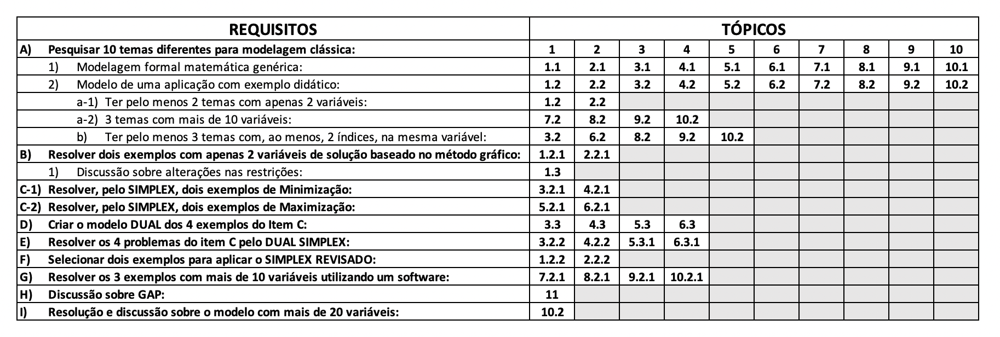

# 1 Problema do Mix de Produção

## 1.1 Modelo genérico


### Conjuntos

$I \colon \{1, \ldots, m\},$

$J \colon \{1, \ldots, n\}.$

### Parâmetros

$a_{ij} \colon \text{Quantidade de horas necessárias para a realização da atividade } i \in I \text{ na fabricação do produto } j \in J,$

$b_i \colon \text{Quantidade de horas disponíveis para realização da atividade } i \in I,$

$c_j \colon \text{Lucro líquido por unidade do produto } j \in J \text{ produzido}.$ 


### Variáveis de decisão

$x_j \colon \text{Quantidade a ser fabricada por semana do produto } j \in J.$


### Formulação matemática

$\text{max }z = \sum\limits_{j \in J} c_j x_{j}.$

sujeito a

$\sum\limits_{j \in J} a_{ij} x_{j} \leq b_{i}, \forall \; i \in I,$

$x_{j} \geq 0, \;\; \forall j \in J.$

## 1.2 Aplicação didática

[Belfiore, P. e Fávero, L.P. 2013] A empresa Venix de brinquedos está revendo seu planejamento de produção de carrinhos e triciclos. O lucro líquido por unidade de carrinho e triciclo produzido é de $\text{R\$ } 12,00$ e $\text{R\$ } 60,00$, respectivamente. As matérias-primas e os insumos necessários para a fabricação de cada um dos produtos são terceirizados, cabendo à empresa os processos de usinagem, pintura e montagem. O processo de usinagem requer 15 minutos de mão de obra especializada por unidade de carrinho e 30 minutos por unidade de triciclo produzida. O processo de pintura requer 6 minutos de mão de obra especializada por unidade de carrinho e 45 minutos por unidade de triciclo produzida. Já o processo de montagem necessita de 6 minutos e 24 minutos para uma unidade de carrinho e de triciclo produzida, respectivamente. O tempo disponível por semana é de 36, 22 e 15 horas para os processos de usinagem, pintura e montagem, respectivamente. A empresa quer determinar quanto produzir de cada produto por semana, respeitando as limitações de recursos, de forma a maximizar o lucro líquido semanal. Formular o problema de programação linear que maximiza o lucro líquido da empresa Venix.

### 1.2.1 Resolução pelo método gráfico

#### Código para gerar a visualização

In [1]:
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 8

In [2]:
# Funções auxiliares:

# Passa como parâmetro um valor (z) e o gradiente da função objetivo
# Retorna as coordenadas de origem e destino de uma curva de nível
def get_coords_curva_nivel(z, gradiente):
    x = 0.0
    y = z/gradiente[1]
    x0 = z/gradiente[0]
    y0 = 0.0
    return x, y, x0, y0

# Passa as coordenadas de origem e destino de uma reta
# Retorna os coeficientes angular e linear:
def get_coefs_reta(x_fim, y_fim, x_ini=0, y_ini=0):
    y_aux = y_fim - y_ini
    x_aux = x_fim - x_ini
    a = y_aux/x_aux
    b = y_fim - a*x_fim
    return a, b


# Plota o gráfico exibindo a região factível, o gradiente e as curvas de nível:
def plotar(A, b, c, sense, max_x=150, max_y=40, z_max=5000, z_step=204, xlabel=None, ylabel=None):
    grad = (c[0], c[1])

    colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', 
            '#bcbd22', '#17becf']

    # Vetor de valores para a variável x1:
    x1 = np.linspace(0, max_x, 2000)

    # Restrições transformadas em igualdade:
    lst_constr = []
    for i in range(len(A)):
        y = (b[i] - A[i][0]*x1) / A[i][1]
        lst_constr.append(y)

    # Variável auxiliar para o gráfico
    dict_lim={
        '<=': 1000, 
        '=': 0, 
        '>=': 0}
    
    # Plota as restrições:
    dict_sense={
        '<=': r'\leq', 
        '=': r'\eq', 
        '>=': r'\geq'}
    for i in range(len(A)):
        lbl_constr = str(A[i][0]) + 'x_1 + ' + str(A[i][1]) + 'x_2 ' + dict_sense[sense[i]] + ' '+ str(b[i])
        plt.plot(x1, lst_constr[i], label=r'$' + lbl_constr + '$', color=colors[i]) # reta
        y_inf = x1*0 + dict_lim[sense[i]]
        plt.fill_between(x1, lst_constr[i], y_inf, facecolor=colors[i], alpha=0.2) # região infactível

    # Plota o vetor gradiente:
    a,b = get_coefs_reta(grad[0], grad[1])
    y_grad = a*x1 + b
    plt.plot(x1, y_grad, color='red', label='gradiente', linestyle='--')

    # Plota as curvas de nível:
    for z in range(1, z_max, z_step):
        x, y, x0, y0 = get_coords_curva_nivel(z, grad)
        a,b = get_coefs_reta(x0, y0, x, y)
        y_level = a*x1 + b
        plt.plot(x1, y_level, color='black', linestyle='--', alpha=0.5)

    # Limita os eixos:
    plt.xlim((0, max_x))
    plt.ylim((0, max_y))
    
    if xlabel is None:
        plt.xlabel(r'$x_1$')
        
    if ylabel is None:
        plt.ylabel(r'$x_2$')
    plt.grid()

In [3]:
# Dados de entrada do problema original:

A = [[0.25, 0.5], 
     [0.1, 0.75], 
     [0.1, 0.4]]

b = [36, 22, 15]

c = [12, 60]

sense = ['<=', '<=', '<=']

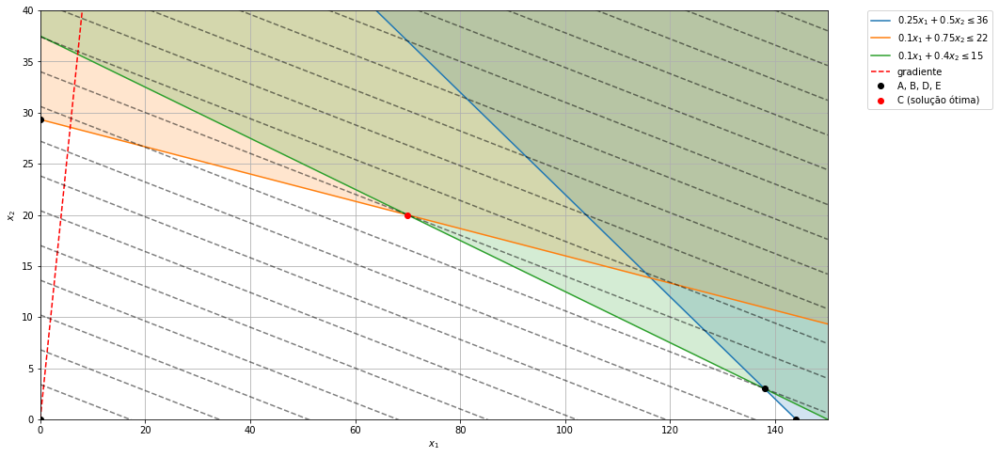

In [4]:
# Plota o gráfico com os vértices:
plotar(A, b, c, sense)
plt.plot(0,0,'ro', color="black", label="A, B, D, E") 
plt.plot(70,20,'ro', color="red", label="C (solução ótima)") 
plt.plot(0,29.33,'ro', color="black") 
plt.plot(138,3,'ro', color="black") 
plt.plot(144,0,'ro', color="black")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

#### Cálculos

##### Gradiente

$\nabla z = (12;60)$

##### Vértices

<b>A:</b>

$x_1 = 0, x_2 = 0$

<br>

<b>B:</b>

$
    \begin{cases}
      x_1 = 0 \\
      0,1x_1 + 0,75x_2 = 22
    \end{cases}
$

$x_1 = 0, x_2 = 29,33$

<br>

<b>C:</b>

$
    \begin{cases}
      0,1x_1 + 0,75x_2 = 22 \\
      0,1x_1 + 0,4x_2 = 15
    \end{cases}
$

$x_1 = 70, x_2 = 20$

<br>

<b>D:</b>

$
    \begin{cases}
      0,1x_1 + 0,4x_2 = 15 \\
      0,25x_1 + 0,5x_2 = 36
    \end{cases}
$

$x_1 = 138, x_2 = 3$

<br>

<b>E:</b>

$
    \begin{cases}
      0,25x_1 + 0,5x_2 = 36 \\
      x_2 = 0
    \end{cases}
$

$x_1 = 144, x_2 = 0$


##### Soluções por vértice:

$z_a = 0$

$z_b = 1759,8$

$z_c = 2040$

$z_d = 1836$

$z_e = 1728$


#### Solução ótima:

$x_1 = 70, x_2 = 20$

$z^\text{*} = \text{R\$ } 2040,00$

### 1.2.2 Resolução pelo Simplex Revisado

#### Forma padrão

##### Variáveis de decisão

$x_1 \colon \text{Quantidade de carrinhos a ser fabricada por semana},$

$x_2 \colon \text{Quantidade de triciclos a ser fabricada por semana}.$

##### Formulação matemática

$\text{max }z = 12x_{1} + 60x_{2}.$

sujeito a

$0,25x_1 + 0,5x_2 + x_5 = 36,$

$0,1x_1 + 0,75x_2 + x_4 = 22,$

$0,1x_1 + 0,4x_2 + x_5 = 15,$

$x_1, \ldots, x_5 \geq 0.$

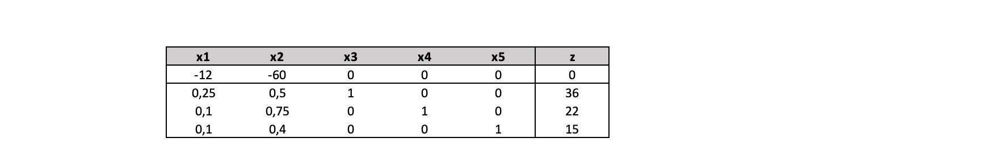

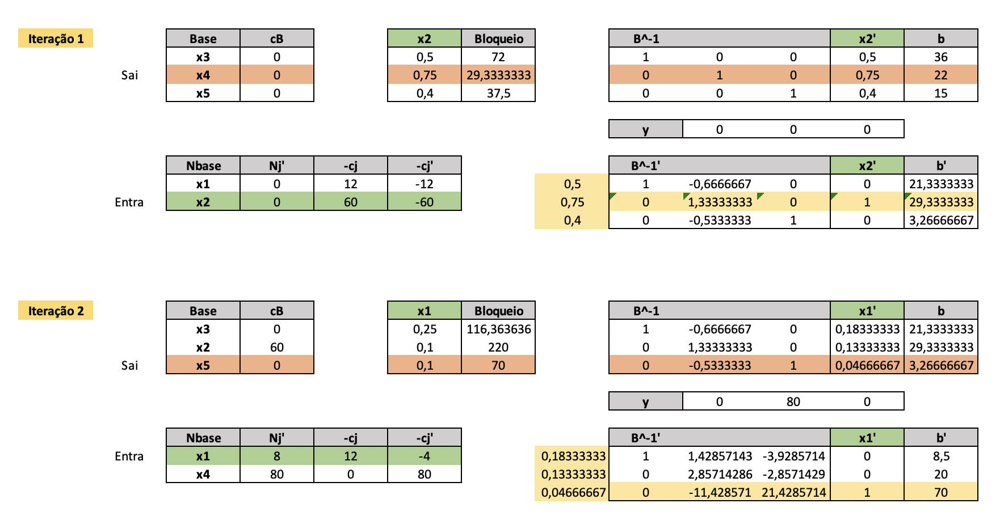

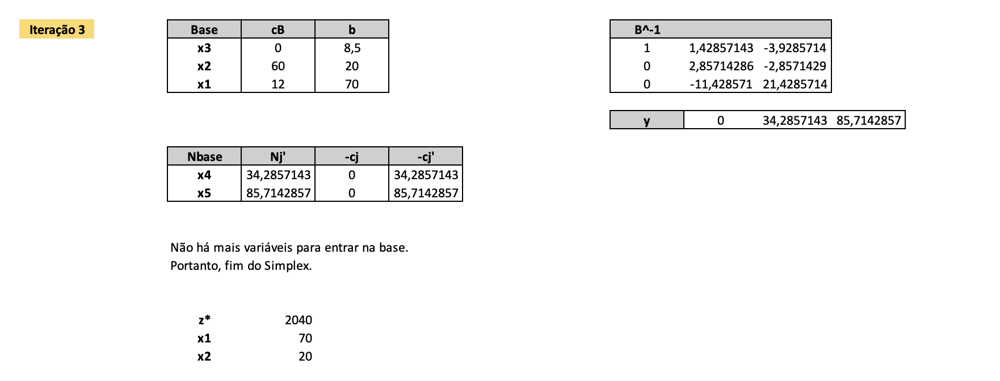

## 1.3 Discussão

Através da resolução pelo método gráfico e analítico constatou-se que a aplicação didática, apresentada no item 1.2, é um problema de **maximização com solução única**. A constatação se deve ao fato da curva de nível que intercepta o vértice $C$ não é paralela a nenhuma das restrições que limitam a região factível. Aproveitando o raciocínio, para transformar o problema original em um problema de **maximização com múltiplas soluções**, basta alterar uma das retrições que formam o vértice $C$, de modo que fique paralela à curva de nível que intercepta o vértice $C$. Por exemplo:

* Dado o vetor gradiente $\nabla z = (12;60)$, encontra-se a reta $x_2 = 5x_1$

* Dada a reta $x_2 = 5x_1$, encontra-se a reta ortogonal $x_2 = -0,2x_1$

* Dada a reta ortogonal $x_2 = -0,2x_1$, encontra-se a reta ortogonal que intercepta o vértice $C$: $x_2 = -0,2x_1+34$

Logo, ao substituir a restrição $0,1x_1 + 0,75x_2 \leq 22$ por $0,2x_1 + x_2 \leq 34$, o problema passa a ter múltiplas soluções, conforme observa-se no gráfico abaixo:

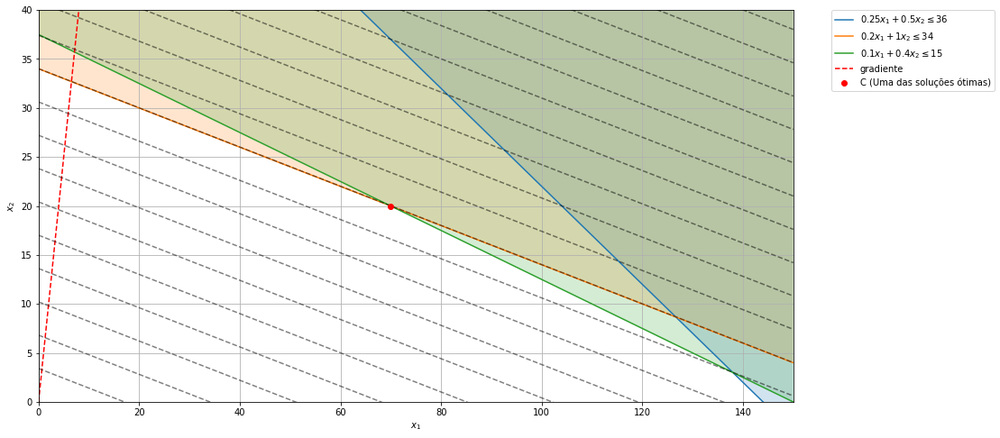

In [5]:
A = [[0.25, 0.5], 
     [0.2, 1], 
     [0.1, 0.4]]

b = [36, 34, 15] 

plotar(A, b, c, sense)
plt.plot(70,20,'ro', color="red", label="C (Uma das soluções ótimas)") 
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Para transformar o problema original em um problema com **solução infinita**, basta alterar as inequações das restrições para $\geq$, mantendo o objetivo de maximização. Deste modo, a região factível torna-se infinita no sentido do crescimento do gradiente, como pode-se observar:

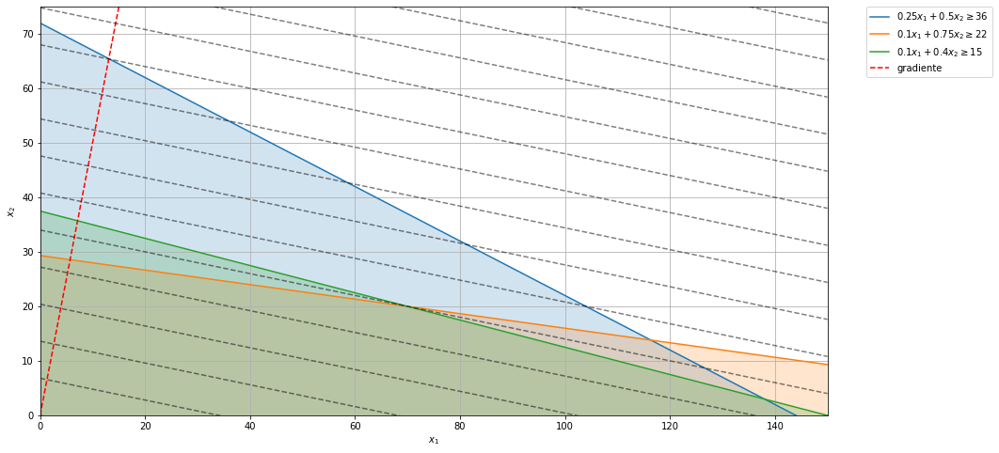

In [6]:
A = [[0.25, 0.5], 
     [0.1, 0.75], 
     [0.1, 0.4]]

b = [36, 22, 15]

c = [12, 60]

sense = ['>=', '>=', '>=']

plotar(A, b, c, sense, max_y=75, z_max=10000, z_step=408)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Para transformar o problema original em uma problema com **solução infactível**, basta alterar a restrição $0,1x_1 + 0,75x_2 \leq 22$ para $0,1x_1 + 0,4x_2 \geq 15$. Deste modo, como pode-se observar no gráfico abaixo, todas as regiões tornam-se restritas.

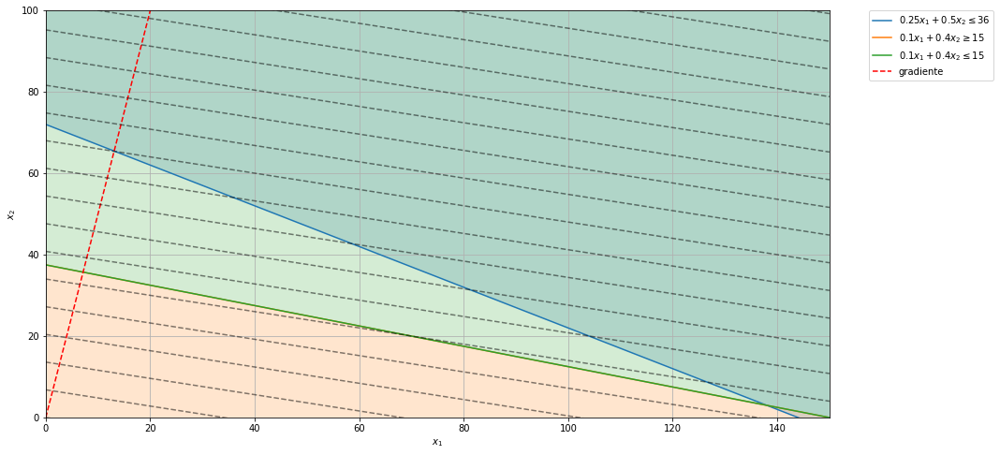

In [7]:
A = [[0.25, 0.5], 
     [0.1, 0.4], 
     [0.1, 0.4]]

b = [36, 15, 15]

c = [12, 60]

sense = ['<=', '>=', '<=']

plotar(A, b, c, sense, max_y=100, z_max=10000, z_step=408)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Ao inverter o sentido das inequações das restrições do problema original, considerando o objetivo de minimização, obtém-se um problema **minimização com solução única**, dado que nenhuma das restrições são paralelas às curvas de nível.

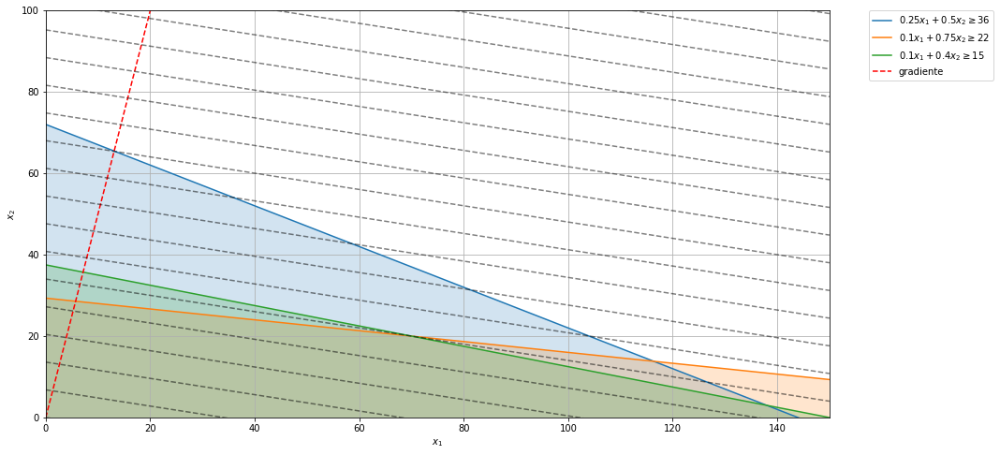

In [8]:
A = [[0.25, 0.5], 
     [0.1, 0.75], 
     [0.1, 0.4]]

b = [36, 22, 15]

c = [12, 60]

sense = ['>=', '>=', '>=']

plotar(A, b, c, sense, max_y=100, z_max=10000, z_step=408)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Para transformar o problema anterior em um problema de **minimização com múltiplas soluções**, basta alterar uma das restrições que delimitam a região viável para que fique paralela com a curva de nível. Exemplo:

* Dado o vetor gradiente $\nabla z = (12;60)$, encontra-se a reta $x_2 = 5x_1$

* Dada a reta $x_2 = 5x_1$, encontra-se a reta ortogonal $x_2 = -0,2x_1$

* Dada a reta ortogonal $x_2 = -0,2x_1$, encontra-se uma reta ortogonal que delimita a região viável $C$: $x_2 = -0,2x_1+41$

Logo, ao substituir a restrição $0,25x_1 + 0,5x_2 \geq 36$ por $0,2x_1 + x_2 \geq 41$, o problema passa a ter múltiplas soluções, conforme observa-se no gráfico abaixo:

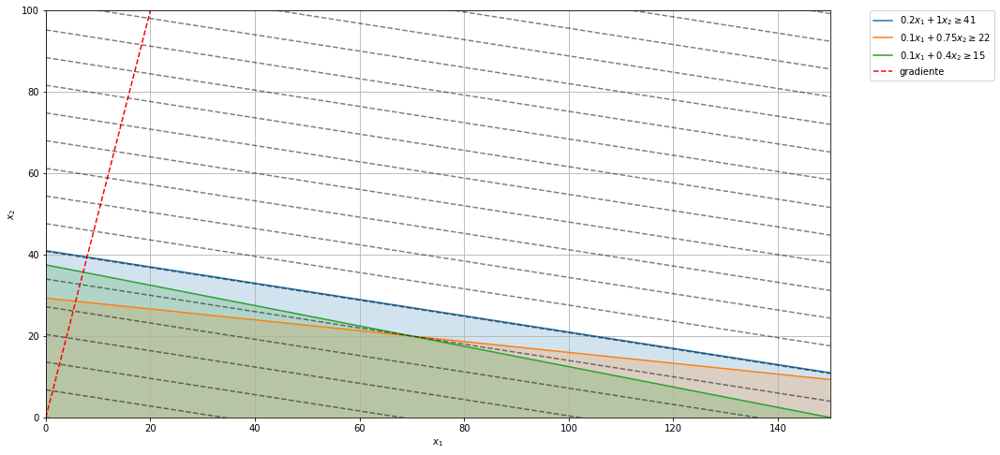

In [9]:
A = [[0.2, 1], 
     [0.1, 0.75], 
     [0.1, 0.4]]

b = [41, 22, 15]

c = [12, 60]

sense = ['>=', '>=', '>=']

plotar(A, b, c, sense, max_y=100, z_max=10000, z_step=408)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<hr>

# 2 Problema da Mistura

## 2.1 Modelo genérico


### Conjuntos

$I \colon \{1, \ldots, m\},$

$J \colon \{1, \ldots, n\}.$


### Parâmetros

$a_{ij} \colon \text{Proporção do nutriente } i \in I \text{ no ingrediente } j \in J,$

$b_i \colon \text{Proporção mínima necessária do nutriente } i \in I \text{ para a composição da mistura},$

$c_j \colon \text{Custo por kg do ingrediente } j \in J.$ 


### Variáveis de decisão

$x_j \colon \text{Quantidade do ingrediente } j \in J \text{ que deve ser utilizada em uma unidade da mistura}.$


### Formulação matemática

$\text{min }z = \sum\limits_{j \in J} c_j x_{j}.$

sujeito a

$\sum\limits_{j \in J} a_{ij} x_{j} \geq b_{i}, \forall \; i \in I,$

$\sum\limits_{j \in J} x_{j} = 1,$

$x_{j} \geq 0 \;\; \forall j \in J.$

## 2.2 Aplicação didática

[Adaptado de Arenales, M. et al., 2007]</b>: Uma agroindústria deve produzir um tipo de ração para determinado animal. Essa ração é produzida pela mistura de farinhas de dois ingredientes básicos: osso e soja. Cada um desses dois ingredientes contém diferentes quantidades de dois nutrientes necessários a uma dieta nutricional balanceada: proteína e cálcio. O nutricionista especifica as necessidades mínimas desses nutrientes em 1kg de ração. Cada ingrediente é adquirido no mercado com um certo custo unitário ($\text{R\$}$/kg). Os dados do problema são apresentados na tabela abaixo. Por exemplo, a farinha de osso é constituída de 20\% de proteína e 60\% de cálcio; a ração deve ser composta de pelo menos 30\% de proteína e 50\% de cálcio; 1kg da farinha de osso custa $\text{R\$}$ 0,56 (os ingredientes podem ser constituídos por outros elementos, mas que não são importantes para o problema em questão). Deve-se determinar em que quantidades os ingredientes devem ser misturados de modo a produzir uma ração que satisfaça às restrições nutricionais com o mínimo custo.


| Nutrientes | Osso | Peixe | Proporção |
| --- | --- | --- | --- |
| Proteína | 0,2 | 0,4 | 0,3 |
| Cálcio | 0,6 | 0,4 | 0,5 |
| Custos ($\text{R\$}$/kg) | 0,56 | 0,46 |  |

### 2.2.1 Resolução pelo método gráfico

#### Código para gerar a visualização

In [10]:
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 8

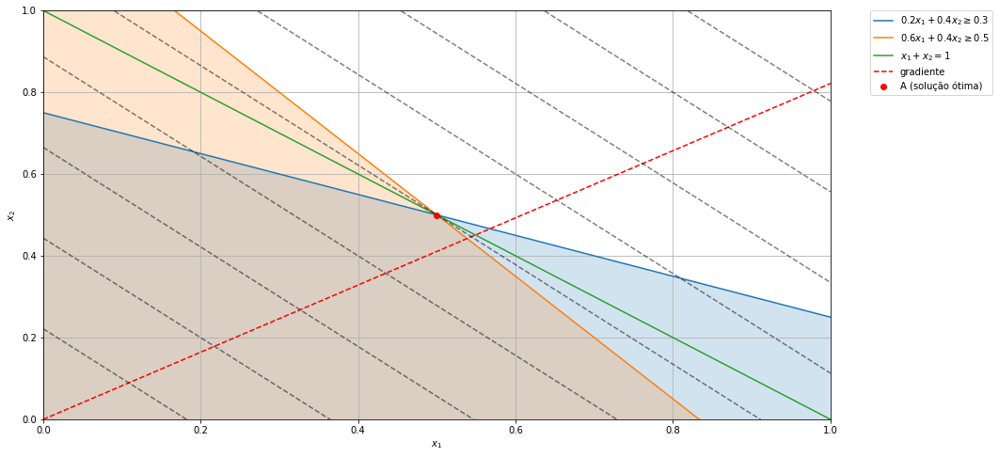

In [11]:
# Limites dos eixos:
max_x = 1
max_y = 1

# Vetor de valores para a variável x1:
x1 = np.linspace(0, max_x, 500)

# Restrições transformadas em igualdade com x2 isolado:
# Restrição 1:
x2_1 = (0.3 - 0.2*x1) / 0.4

# Restrição 2:
x2_2 = (0.5 - 0.6*x1) / 0.4

# Restrição 3:
x2_3 = 1 - x1

# Variável auxiliar para o gráfico:
y_inf = x1*0 + 1000

# Plota as retas das restrições:
plt.plot(x1, x2_1, label=r'$0.2x_1 + 0.4x_2 \geq 0.3$')
plt.plot(x1, x2_2, label=r'$0.6x_1 + 0.4x_2 \geq 0.5$')
plt.plot(x1, x2_3, label=r'$x_1 + x_2 = 1$')

# Preenche a região infactível:
plt.fill_between(x1, x2_1, facecolor='#1f77b4', alpha=0.2)
plt.fill_between(x1, x2_2, facecolor='#ff7f0e', alpha=0.2)

# Plota o vetor gradiente:
gradiente = (0.56, 0.46) 

a,b = get_coefs_reta(gradiente[0], gradiente[1])
y_grad = a*x1 + b
plt.plot(x1, y_grad, color='red', label='gradiente', linestyle='--')


# Plota as curvas de nível:
for z in np.arange(0.102, 2, 0.102):
    x, y, x0, y0 = get_coords_curva_nivel(z, gradiente)
    a,b = get_coefs_reta(x0, y0, x, y)
    y_level = a*x1 + b
    plt.plot(x1, y_level, color='black', linestyle='--', alpha=0.5)

# Limita os eixos:
plt.xlim((0, max_x))
plt.ylim((0, max_y))
plt.xlabel(r'$x_1$')
plt.ylabel(r'$x_2$')

# Plota o vértice que maximiza z:
plt.plot(0.5,0.5,'ro', color="red", label="A (solução ótima)") 
 
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid()

#### Cálculos

##### Gradiente

$\nabla z = (0,56;0,46)$

##### Vértice

<b>A:</b>

$
    \begin{cases}
      0,2x_1 + 0,4x_2 = 0,3 \\
      0,6x_1 + 0,4x_2 = 0,5 \\
      x_1 + x_2 = 1
    \end{cases}
$

$x_1 = 0.5, x_2 = 0.5$



#### Solução ótima:

$x_1 = 0,5, x_2 = 0,5$

$z^\text{*} = \text{R\$ } 0.51$

### 2.2.2 Resolução pelo Simplex Revisado

#### Forma padrão

##### Variáveis de decisão

$x_1 \colon \text{quantidade em kg de farinha de osso que deve ser utilizada em 1kg de ração},$

$x_2 \colon \text{quantidade em kg de farinha de peixe que deve ser utilizada em 1kg de ração}.$

##### Formulação matemática

$\text{max }-z = -0,56x_{1} - 0,46x_{2}.$

sujeito a

$0,2x_1 + 0,4x_2 - x_3 = 0,3,$

$0,6x_1 + 0,4x_2 + x_4 = 0,5,$

$x_1 + x_2 = 1,$

$x_1, \ldots, x_4 \geq 0.$

#### Quadro Simplex inicial

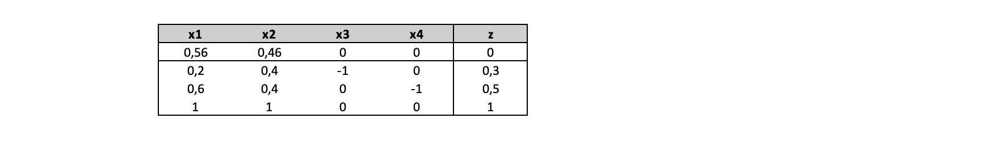

#### Forma padrão com variáveis artificiais

##### Formulação matemática

$\text{max }-w = -x_5 - x_6 - x_7$

$\text{max }-z = -0,56x_{1} - 0,46x_{2}$

sujeito a:

$0,2x_1 + 0,4x_2 - x_3 + x_5 = 0,3$

$0,6x_1 + 0,4x_2 + x_4 + x_6 = 0,5$

$x_1 + x_2 + x_7 = 1$

$x_1, \ldots, x_7 \geq 0$

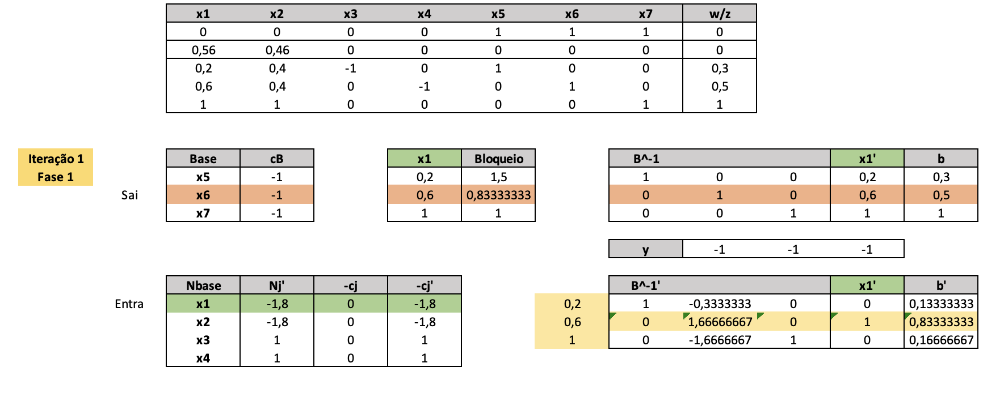

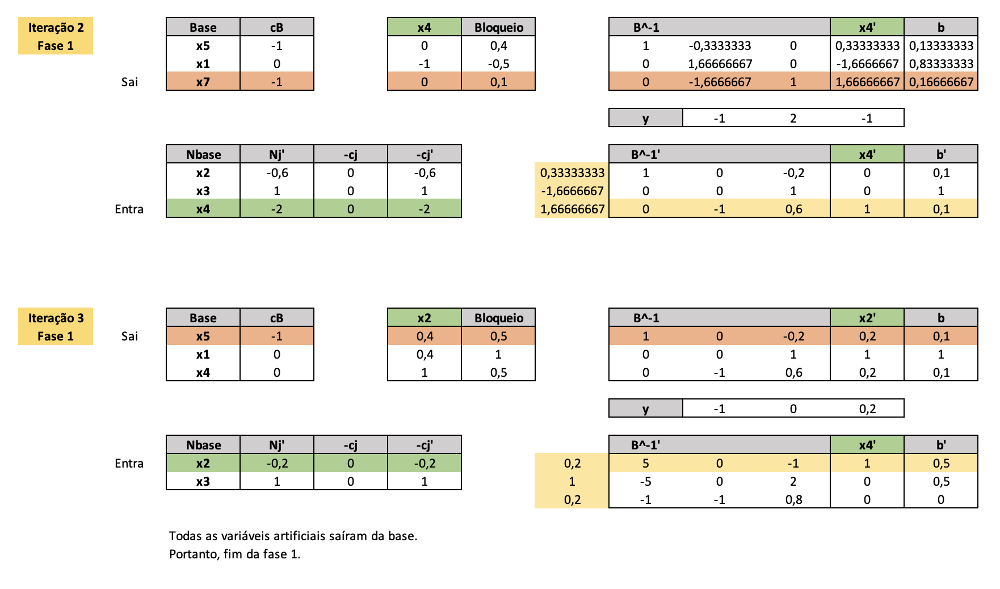

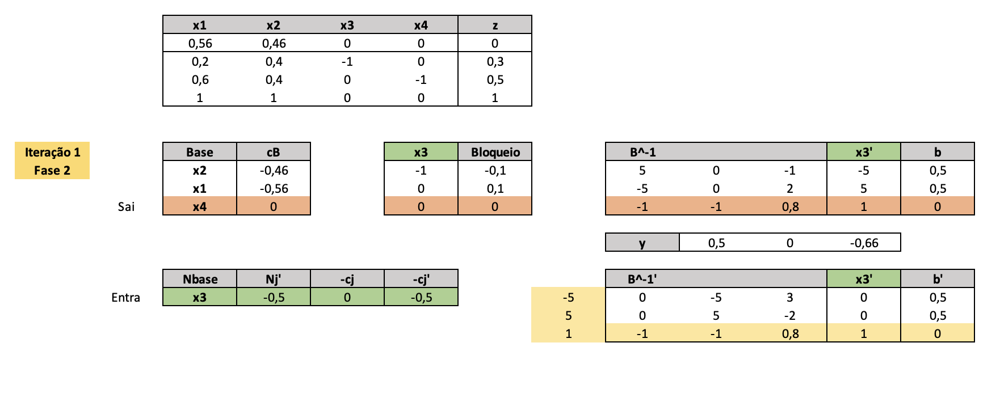

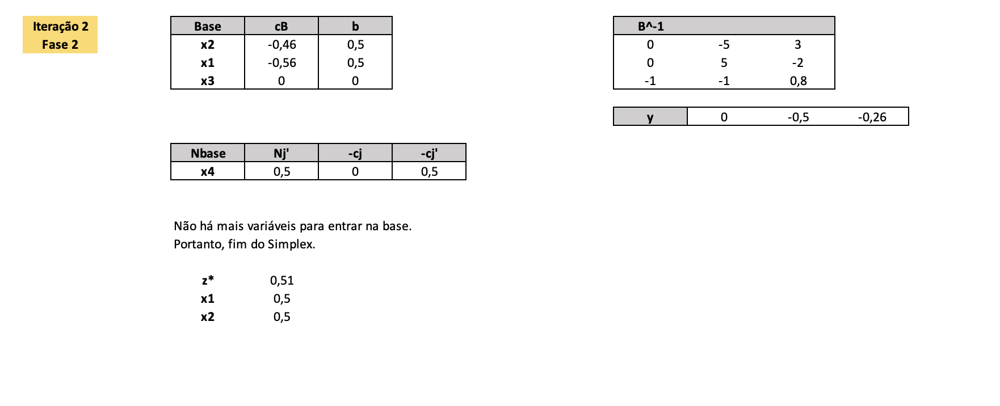

<hr>

# 3 Problema do Transporte

## 3.1 Modelo genérico


### Conjuntos

$I \colon \{1, 2,\ldots, m\},$

$J \colon \{1, 2, \ldots, n\}.$


### Parâmetros

$c_{ij} \colon \text{Custo unitário de transporte do fornecedor } i \in I \text{ para o consumidor } j \in J,$

$a_i \colon \text{Capacidade de abastecimento do fornecedor } i \in I,$

$b_j \colon \text{Demanda do consumidor } j \in J.$
 


### Variáveis de decisão

$x_{ij} \colon \text{Quantidades transportadas do fornecedor } i \in I \text{ para o consumidor }j \in J.$


### Formulação matemática

$\text{min }z = \sum\limits_{i \in I} \sum\limits_{j \in J} c_{ij} x_{ij}.$

sujeito a

$\sum\limits_{j \in I} x_{ij} \leq a_{i}, \forall \; i \in I,$

$\sum\limits_{i \in J} x_{ij} \geq b_{j}, \forall \; j \in J,$

$x_{ij} \geq 0 \;\; \forall i \in I \text{, }j \in J.$

## 3.2 Aplicação didática

[Belfiore, P. e Fávero, L.P. 2013] A Karpet Ltda é uma empresa fabricante de autopeças, cujas sedes estão localizadas em Osasco e São Sebastião. Seus clientes encontram-se em São Paulo e Rio de Janeiro. Os custos unitários de transporte de cada origem para cada destino, assim como a capacidade de cada fornecedor e a demanda de cada cliente, encontram-se na tabela abaixo. O objetivo é atender a demanda de cada consumidor final, respeitando as capacidades de fornecimento, de forma a minimizar o custo total de transporte. Modelar o problema de transporte.

| Origem | São Paulo | Rio de Janeiro |  Capacidade |
| --- | --- | --- | --- | 
| Osasco | 12 | 24 | **190** |
| São Sebastião | 21 | 14 | **110** |
| Demanda | **120** | **160** | 

### 3.2.1 Resolução pelo Simplex

#### Forma padrão

##### Variáveis de decisão

$x_1 \colon \text{quantidade transportada do fornecedor 1 para o consimidor 1},$

$x_2 \colon \text{quantidade transportada do fornecedor 1 para o consimidor 2},$

$x_3 \colon \text{quantidade transportada do fornecedor 2 para o consimidor 1},$

$x_4 \colon \text{quantidade transportada do fornecedor 2 para o consimidor 2}.$

##### Formulação matemática

$\text{max }-z = -12x_{1} - 24x_{2} - 21x_{3} - 14x_{4}.$

sujeito a

$x_{1} + x_{2} + x_5 = 190,$

$x_{3} + x_{4} + x_6 = 110,$

$x_{1} + x_{3} - x_7 = 120,$

$x_{2} + x_{4} - x_8 = 160,$

$x_1, \ldots, x_8 \geq 0.$

#### Quadro simplex inicial

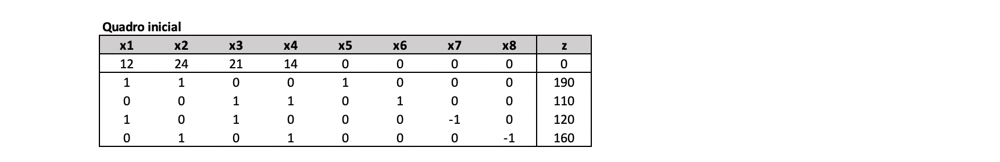

#### Forma padrão com variáveis artificiais

##### Formulação matemática

$\text{max }-w = -x_{9} - x_{10},$

$\text{max }-z = -12x_{1} - 24x_{2} - 21x_{3} - 14x_{4}.$

sujeito a

$x_{1} + x_{2} + x_5 = 190,$

$x_{3} + x_{4} + x_6 = 110,$

$x_{1} + x_{3} - x_7 + x_9 = 120,$

$x_{2} + x_{4} - x_8 + x_{10} = 160,$

$x_1, \ldots, x_{10} \geq 0.$

#### Fase 1

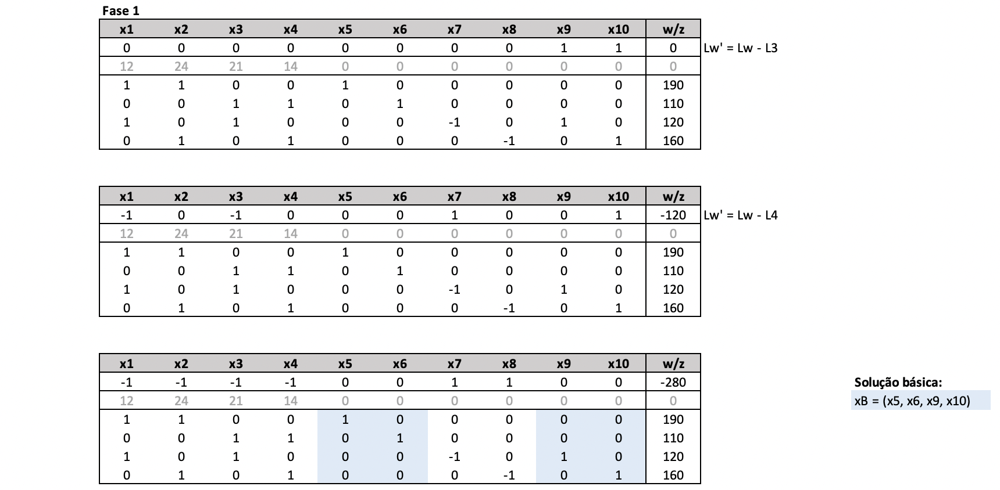

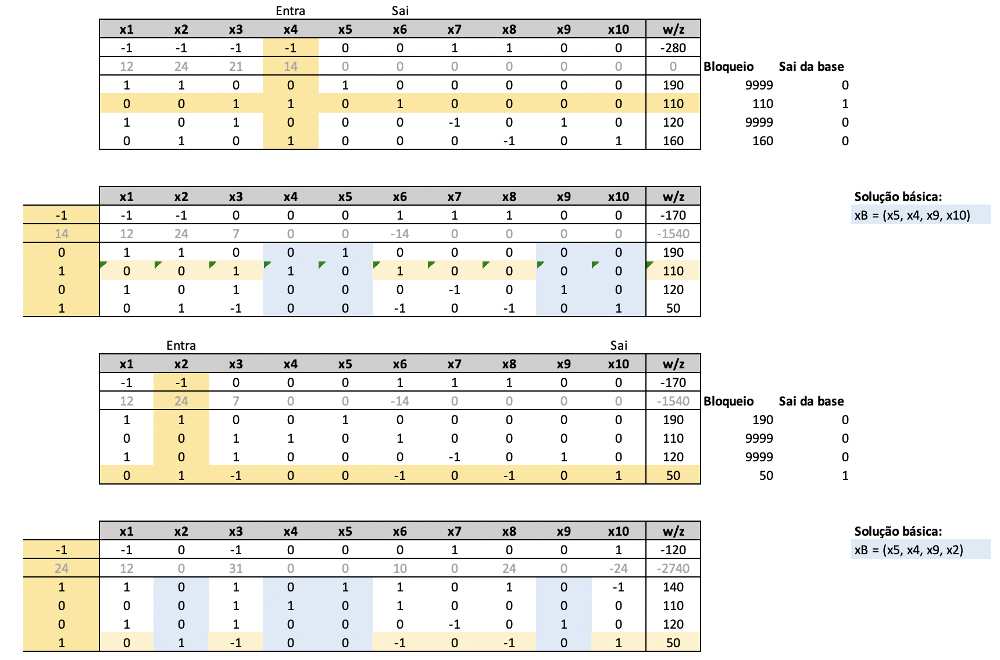

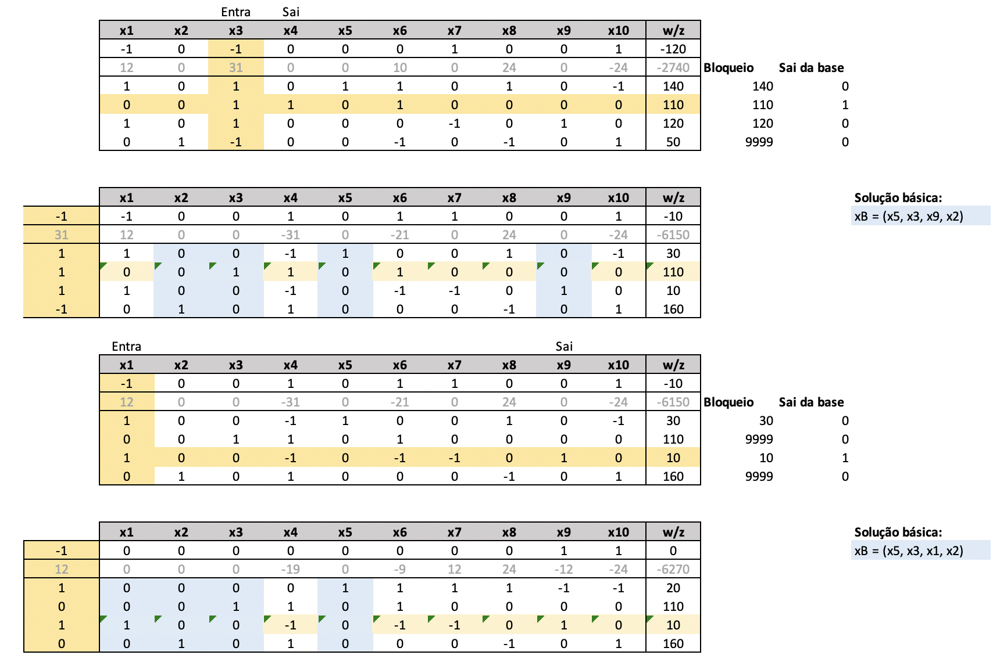

#### Fase 2

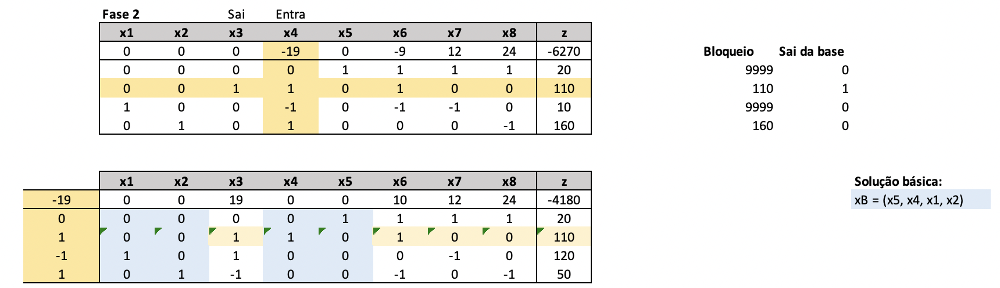

#### Solução ótima

$x_1 = 120$

$x_2 = 50$

$x_3 = 0$

$x_4 = 110$

$z^\text{*} = 4180$

### 3.2.2 Resolução pelo Dual Simplex

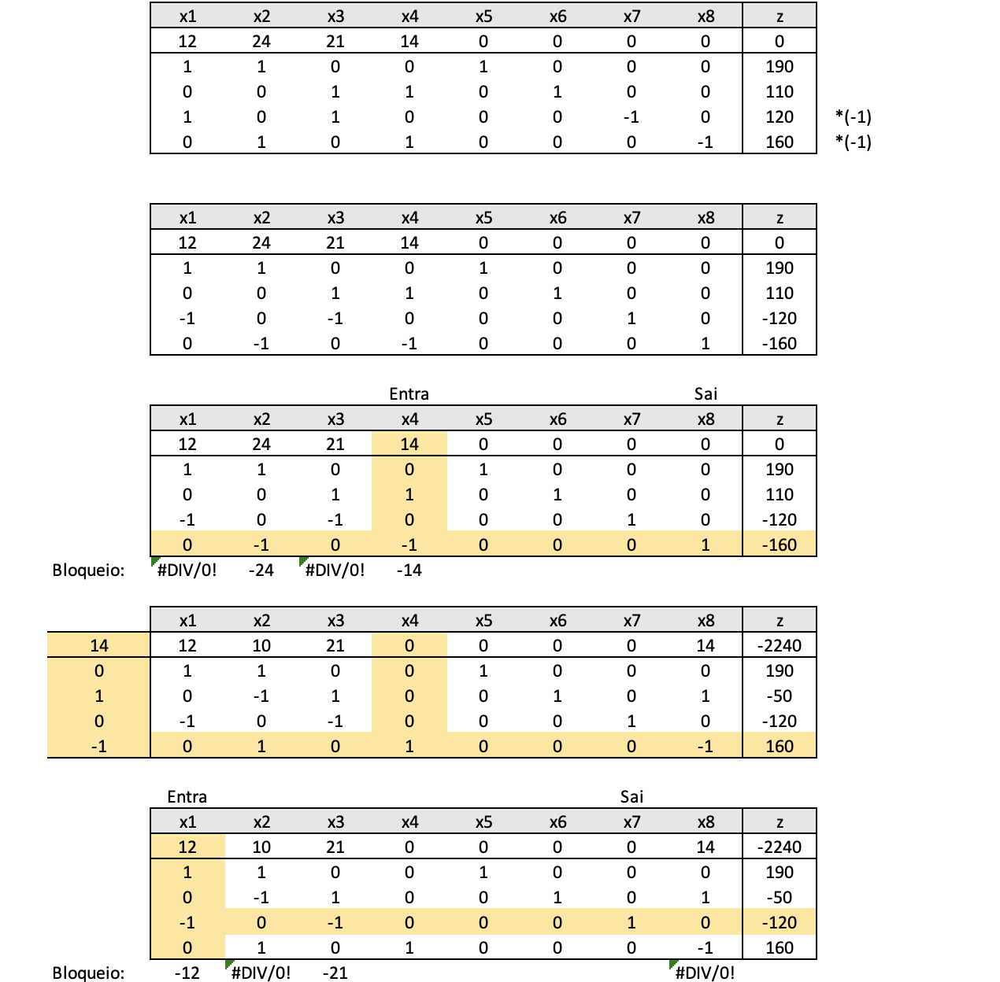

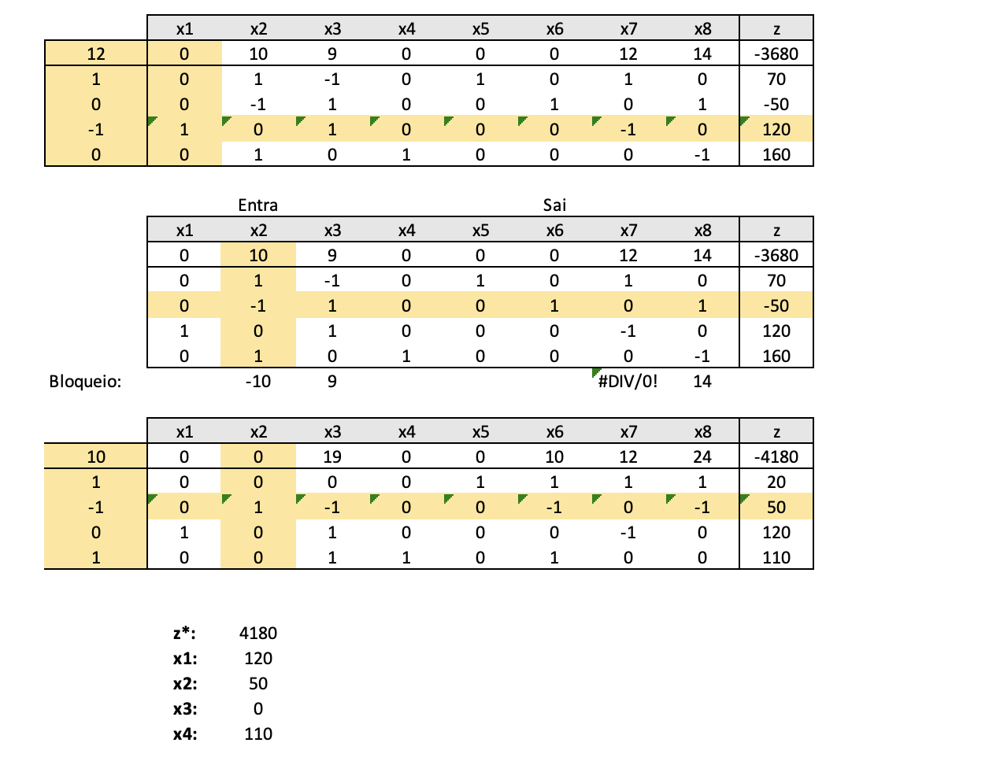

## 3.3 Modelo Dual

### Conjuntos

$I \colon \{1, 2,\ldots, m\},$

$J \colon \{1, 2, \ldots, n\}.$


### Parâmetros

$c_{ij} \colon \text{Custo unitário de transporte do fornecedor } i \in I \text{ para o consumidor } j \in J,$

$a_i \colon \text{Capacidade de abastecimento do fornecedor } i \in I,$

$b_j \colon \text{Demanda do consumidor } j \in J.$
 

### Variáveis de decisão

$u_{i} \colon \text{Variável dual associada à restrição de oferta } i \in I,$

$v_{j} \colon \text{Variável dual associada à restrição de demanda } j \in J.$


### Formulação matemática

$\text{max }w = \sum\limits_{i \in M} a_i u_i + \sum\limits_{j \in N} b_j v_j.$

sujeito a

$u_i + v_j \leq c_{ij} \;\; \forall i \in I \text{, } j \in J.$

$u_i \leq 0 \;\; \forall i \in I,$

$v_j \geq 0 \;\; \forall j \in J.$

### 3.3.1 Resolução através do Gurobi e Pyomo

#### Definição dos dados de entrada

In [12]:
c = [[12,24], 
     [21,14]]

a = [190, 110]

b = [120, 160]

#### Declaração do modelo computacional

In [13]:
import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjuntos:
modelo.I = pyo.RangeSet(len(a)) 
modelo.J = pyo.RangeSet(len(b))

# Parâmetros:
modelo.c = pyo.Param(modelo.I, modelo.J, initialize=lambda modelo, i, j: c[i-1][j-1])
modelo.a = pyo.Param(modelo.I, initialize=lambda modelo, i: a[i-1])
modelo.b = pyo.Param(modelo.J, initialize=lambda modelo, j: b[j-1])

# Variáveis de decisão:
modelo.u = pyo.Var(modelo.I, within=pyo.NegativeReals)
modelo.v = pyo.Var(modelo.I, within=pyo.NonNegativeReals)

# Função objetivo:
def f_obj(modelo):
    return sum(modelo.a[i] * modelo.u[i] for i in modelo.I) + sum(modelo.b[j] * modelo.v[j] for j in modelo.J)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.maximize)

# Restrições:

def f_restr1(modelo, i, j):
    return modelo.u[i] + modelo.v[j] <= modelo.c[i,j]
modelo.restr_1 = pyo.Constraint(modelo.I, modelo.J, rule=f_restr1)

#### Solução

In [14]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


--------------------------------------------
--------------------------------------------

Academic license - for non-commercial use only - expires 2021-06-07
Using license file /Users/acsjunior/gurobi.lic

Problem: 
- Name: unknown
  Lower bound: 4180.0
  Upper bound: 4180.0
  Number of objectives: 1
  Number of constraints: 4
  Number of variables: 4
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 4
  Number of nonzeros: 8
  Sense: -1
  Number of solutions: 1
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 0.006934165954589844
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



In [15]:
for i in modelo.I:
    print("u"+str(i)+":", modelo.u[i]())

u1: 0.0
u2: -10.0


In [16]:
for j in modelo.J:
    print("v"+str(j)+":", modelo.v[j]())

v1: 12.0
v2: 24.0


In [17]:
print("Função objetivo:", round(modelo.obj(),2))

Função objetivo: 4180.0


<hr>

# 4 Problema da Dieta

## 4.1 Modelo genérico

### Conjunto:

$I \colon \{1, 2, \ldots, m\},$

$J \colon \{1, 2, \ldots, n\}.$

### Parâmetros

$a_{ij} \colon \text{Quantidade do nutriente } j \in J \text{ presente no alimento }i \in I,$

$b_{j} \colon \text{Necessidade diária do nutriente } j \in J.$

$c_{i} \colon \text{Preço (R\$) do alimento } i \in I,$

### Variáveis de decisão

$x_{i} = \text{Quantidade do alimento } i \in I \text{ a ser consumido diariamente}.$


### Formulação matemática

$\text{min }z = \sum\limits_{j \in J} c_{i} x_{i}.$

sujeito a

$\sum\limits_{i \in I} a_{ij} x_{i} \geq b_j \;\; \forall j \in J,$

$x_{i} \geq 0 \;\; \forall i \in I.$

## 4.2 Aplicação didática
[Belfiore, P. e Fávero, L.P. 2013] A anemia é uma doença decorrente de baixos níveis de hemoglobina no sangue, proteína esta responsável pelo transporte de oxigênio. Para sua prevenção, deve-se adotar uma dieta rica em ferro, vitamina A e ácido fólico. Esses nutrientes podem ser encontrados em diversos alimentos. A Tabela abaixo apresenta as necessidades diárias de cada nutriente, a respectiva quantidade em cada um dos alimentos e o preço por alimento. A fim de prevenir que seus pacientes apresentem esse tipo de anemia, o Hospital Metrópole está estudando uma nova dieta. O objetivo é selecionar os ingredientes, com o menor custo possível, que farão parte das duas principais refeições diárias (almoço e jantar), de forma que 100% das necessidades diárias de cada um desses nutrientes sejam atendidas nas duas refeições.

|  | Ferro (mg) | Vitamina A (UI) | Ácido fólico (mg) | Preço (R$) |
| --- | --- | --- | --- |  --- |
| Agrião | 2 | 47250 | 1 | **1,6** |
| Feijão | 71 | 0 | 0,56 | **5** |
| Ovo | 9 | 32150 | 0,5 | **3** |
| Carne | 15 | 0 | 0,6 | **7,5** |
| Necessidades diárias | **80** | **45000** | **4** |  |

### 4.2.1 Resolução pelo Simplex

#### Forma padrão

##### Variáveis de decisão

$x_{i} \colon \text{quantidade (kg) do alimento } i \text{ a ser consumido diariamente }, i=1, \ldots, 4.$

##### Formulação matemática

$\text{max }-z = -1,6x_1 - 5x_2 - 3x_3 - 7,5x_4.$

sujeito a

$2x_1 + 71x_2 + 9x_3 + 15x_4 - x_5 =  80,$

$47250x_1 + 32150x_3 - x_6 = 45000,$

$x_1 + 0,56x_2 + 0,5x_3 + 0,6x_4 - x_7 = 4,$

$x_1, \ldots, x_7 \geq 0.$

#### Quadro simplex inicial

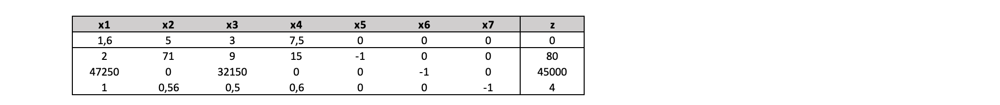

#### Forma padrão com variáveis artificiais

##### Formulação matemática 

$\text{max }-w = -x_8 - x_9 - x_{10},$

$\text{max }-z = -1,6x_1 - 5x_2 - 3x_3 - 7,5x_4.$

sujeito a

$2x_1 + 71x_2 + 9x_3 + 15x_4 - x_5 + x_8 =  80,$

$47250x_1 + 32150x_3 - x_6 + x_9 = 45000,$

$x_1 + 0,56x_2 + 0,5x_3 + 0,6x_4 - x_7 + x_{10} = 4,$

$x_1, \ldots, x_{10} \geq 0.$

#### Fase 1

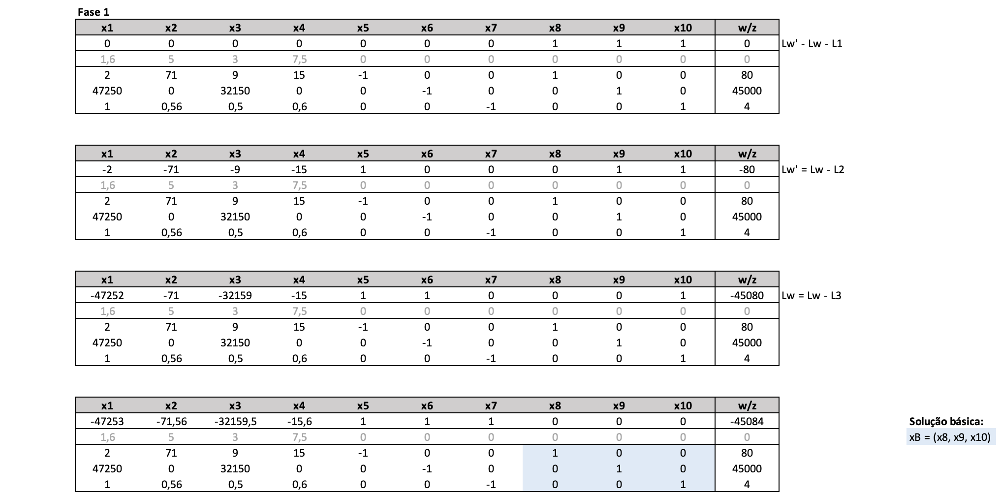

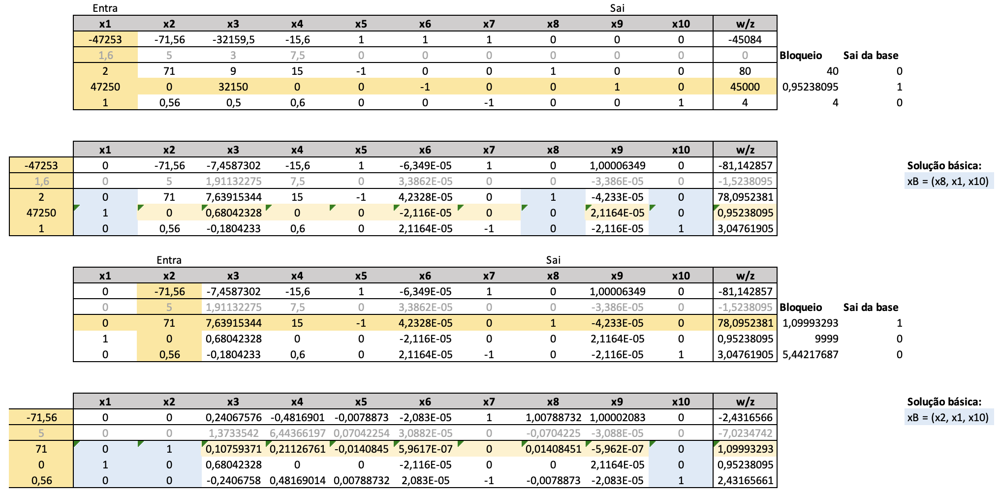

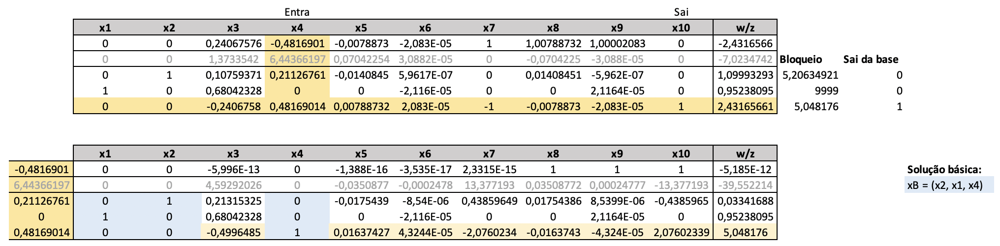

#### Fase 2

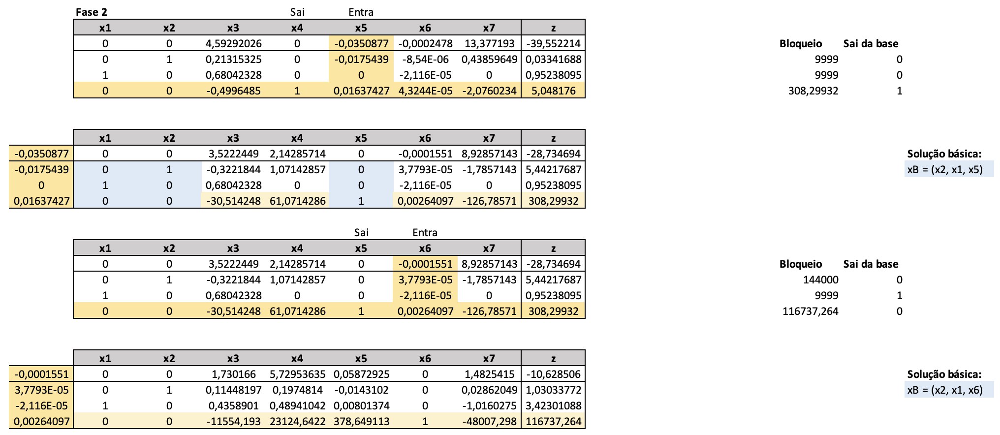

#### Solução ótima

$x_1 = 3,42301088$

$x_2 = 1,03033772$

$x_3 = 0$

$x_4 = 0$

$z^\text{*} = 10,628506$

### 4.2.2 Resolução pelo Dual Simplex

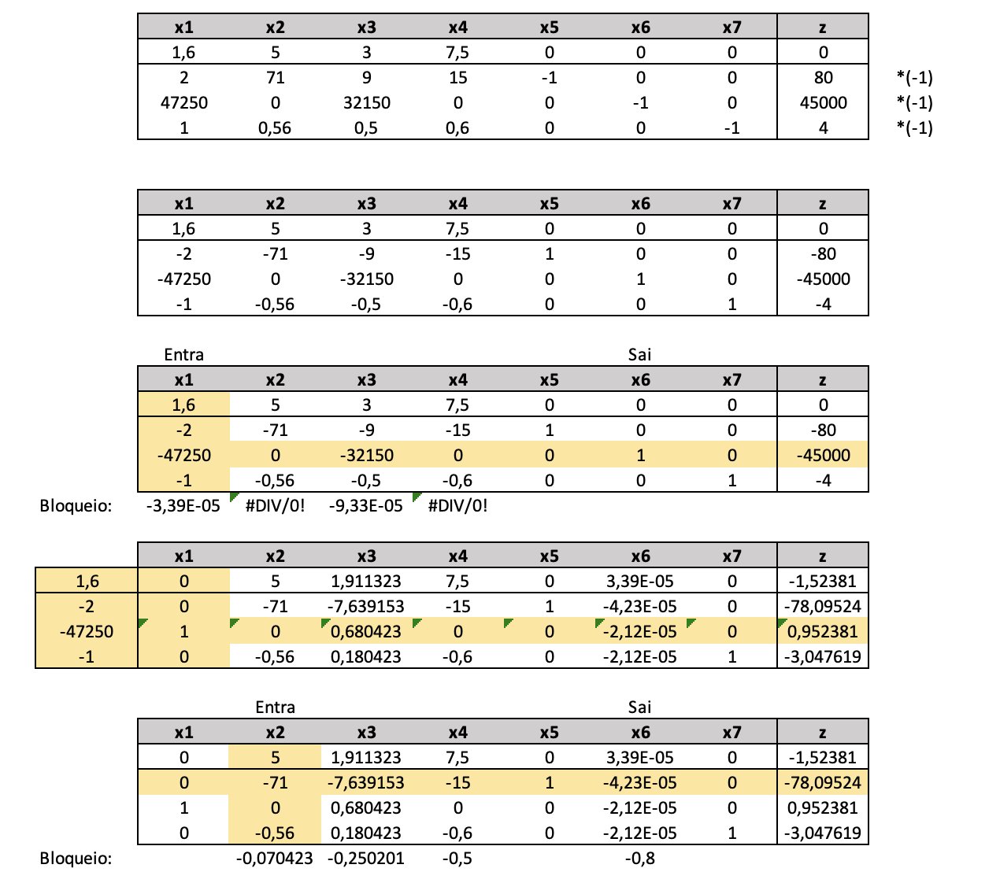

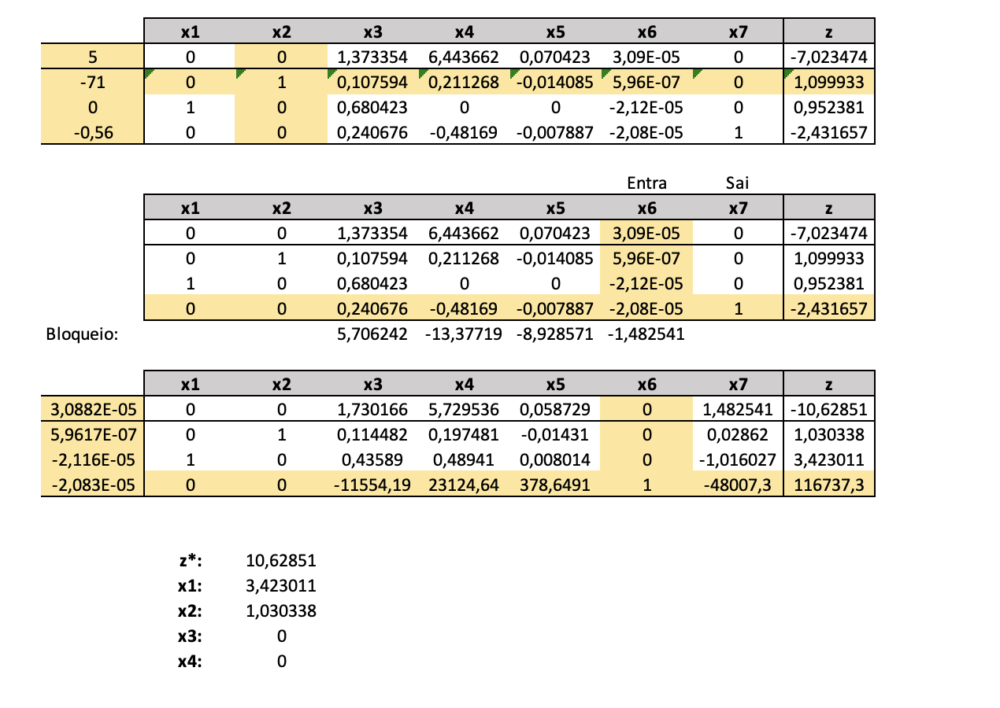

## 4.3 Modelo Dual

### Conjunto:

$I \colon \{1, 2, \ldots, m\},$

$J \colon \{1, 2, \ldots, n\}.$

### Parâmetros

$a_{ij} \colon \text{Quantidade do nutriente } j \in J \text{ presente no alimento }i \in I,$

$b_{j} \colon \text{Necessidade diária do nutriente } j \in J.$

$c_{i} \colon \text{Preço (R\$) do alimento } i \in I,$

### Variáveis de decisão

$u_{j} = \text{Variável dual associada ao nutriente }j \in J.$


### Formulação matemática

$\text{max }w = \sum\limits_{j \in J} b_{j} u_{j}.$

sujeito a

$\sum\limits_{j \in J} a_{ij} u_{j} \leq c_i \;\; \forall i \in I,$

$u_j \geq 0 \;\; \forall j \in J.$

### 4.3.1 Resolução através do Gurobi e Pyomo

#### Definição dos dados de entrada

In [18]:
a = [[2, 47250, 1], 
     [71, 0, 0.56], 
     [9, 32150, 0.5], 
     [15, 0, 0.5]]

b = [80, 45000, 4]

c = [1.6, 5, 3, 7.5]

#### Declaração do modelo computacional

In [19]:
import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjunto:
modelo.I = pyo.RangeSet(len(c))
modelo.J = pyo.RangeSet(len(b))

# Parâmetros:
modelo.a = pyo.Param(modelo.I, modelo.J, initialize=lambda modelo, i, j: a[i-1][j-1])
modelo.b = pyo.Param(modelo.J, initialize=lambda modelo, j: b[j-1])
modelo.c = pyo.Param(modelo.I, initialize=lambda modelo, i: c[i-1])


# Variáveis de decisão:
modelo.u = pyo.Var(modelo.J, within=pyo.NonNegativeReals)


# Função objetivo:
def f_obj(modelo):
    return sum(modelo.b[j] * modelo.u[j] for j in modelo.J)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.maximize)

# Restrições:

def f_restr1(modelo, i):
    return sum(modelo.a[i,j] * modelo.u[j] for j in modelo.J) <= modelo.c[i]
modelo.restr_1 = pyo.Constraint(modelo.I, rule=f_restr1)

#### Solução

In [20]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


Problem: 
- Name: unknown
  Lower bound: 10.628506010303376
  Upper bound: 10.628506010303376
  Number of objectives: 1
  Number of constraints: 4
  Number of variables: 3
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 3
  Number of nonzeros: 10
  Sense: -1
  Number of solutions: 1
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 0.010972023010253906
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



In [21]:
for j in modelo.J:
    print("u"+str(j)+":", modelo.u[j]())

u1: 0.05872925014310246
u2: 0.0
u3: 1.4825414997137947


In [22]:
print("Função objetivo:", round(modelo.obj(),2))

Função objetivo: 10.63


<hr>

# 5 Problema da Mochila

## 5.1 Modelo genérico

### Conjunto:

$J \colon \{1, \ldots, n\}.$

### Parâmetros

$c_{j} \colon \text{Utilidade do objeto } j \in J,$

$p_j \colon \text{Peso (g) do objeto } j \in J,$

$c_{\text{max}} \colon \text{Capacidade máxima da mochila (g)}.$


### Variáveis de decisão

$x_j \colon \text{Número de objetos do tipo }j \in J \text{ colocados na mochila}.$


 ### Formulação matemática

$\text{max }z = \sum\limits_{j \in J} c_{j} x_{j}.$

sujeito a

$\sum\limits_{j \in J} p_j x_{j} \leq c_{\text{max}},$

$x_{j} \geq 1 \;\; \forall j \in \{1,2\},$

$x_{j} \geq 0 \;\; \forall j \in J.$

## 5.2 Aplicação didática

[Belfiore, P. e Fávero, L.P. 2013] Um alpinista deseja escolher quais objetos carregar na mochila (programação binária) a fim de maximizar a sua utilidade. Para cada possível objeto, o alpinista atribui uma nota em função de sua utilidade, conforme mostra a tabela abaixo. O peso de cada objeto também está ilustrado na mesma tabela. O peso máximo que o alpinista pode carregar é de 5 kg e o alpinista deve levar ao menos 1 garrafa de oxigênio e 1 garrafa d'água. Modele o problema da mochila.

| Objeto | Utilidade | Peso (g) |
| --- | --- | --- | 
| Garrafas de oxigênio | 10 | 1500 | 
| Água | 9 | 800 |
| Máquina fotográfica| 6 | 400 |
| Protetor solar | 5 | 200 |
| Celular | 2 | 100 | 

### 5.2.1 Resolução pelo Simplex

#### Forma padrão

##### Variáveis de decisão

$x_j \colon \text{número de objetos do tipo }j \text{ colocados na mochila}, j=1, \ldots, 5.$

##### Formulação matemática

$\text{max }z = 10x_1 + 9x_2 + 6x_3 + 5x_4 + 2x_5.$

sujeito a

$1500x_1 + 800x_2 + 400x_3 + 200x_4 + 100x_5 + x_6 = 5000,$

$x_1 - x_7 = 1,$

$x_2 - x_8 = 1,$

$x_1, \ldots, x_8 \geq 0.$

#### Quadro simplex inicial

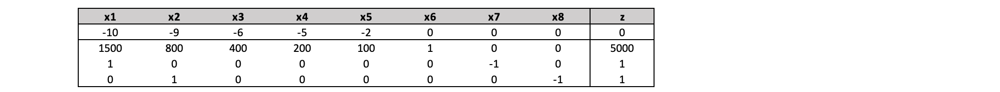

#### Forma padrão com variáveis artificiais

##### Formulação matemática

$\text{max }z = 10x_1 + 9x_2 + 6x_3 + 5x_4 + 2x_5.$

sujeito a

$1500x_1 + 800x_2 + 400x_3 + 200x_4 + 100x_5 + x_6 = 5000,$

$x_1 - x_7 + x_9 = 1,$

$x2 - x8 + x_{10} = 1,$

$x_1, \ldots, x_{10} \geq 0.$

#### Fase 1

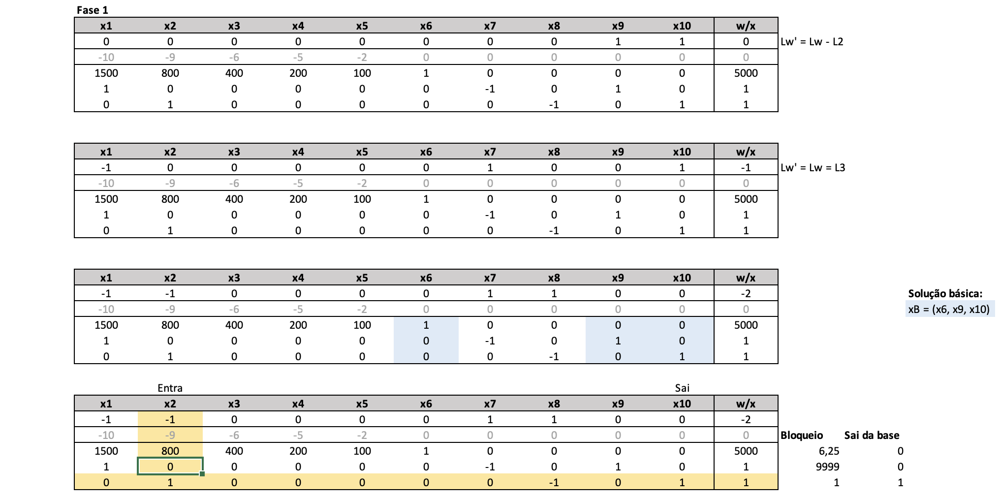

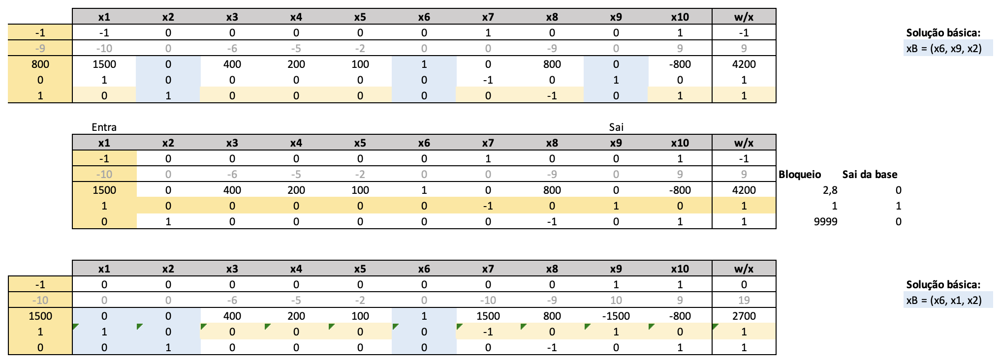

#### Fase 2

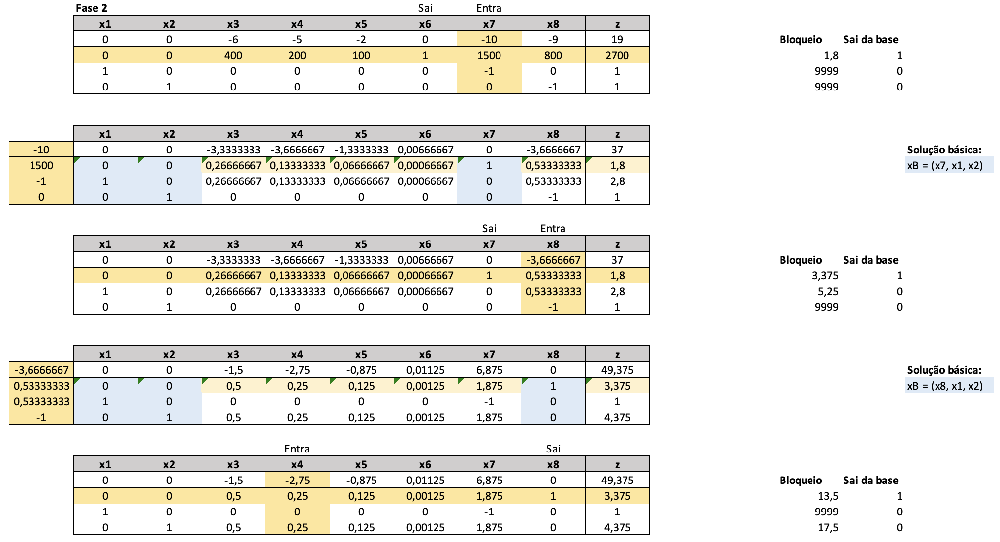

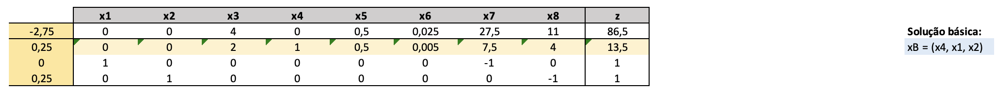

#### Solução ótima (relaxada)

$x_1 = 1$

$x_2 = 1$

$x_3 = 0$

$x_4 = 13,5$

$x_5 = 0$

$z^\text{*} = 86,5$

## 5.3 Modelo Dual

### Conjunto:

$I \colon \{1, \ldots, m\},$

### Parâmetros

$c_{i} \colon \text{Utilidade do objeto } j \in I,$

$p_i \colon \text{Peso (g) do objeto } i \in I,$

$c_{\text{max}} \colon \text{Capacidade máxima da mochila (g)},$

$g_i \colon \text{Parâmetro auxiliar para a variável v}, \; \forall i \in I,$

$a_i \colon \text{Parâmetro auxiliar para a variável y}, \; \forall i \in I.$


### Variáveis de decisão

$u \colon \text{Variável dual associada à restrição de capacidade máxima da mochila},$

$v \colon \text{Variável dual associada à restrição de quantidade mínima garrafas de oxigênio},$

$y \colon \text{Variável dual associada à restrição de quantidade mínima garrafas d'água}.$


### Formulação matemática

$\text{min }w = c_{\text{max}} u + v + y.$

sujeito a

$p_i u + g_i v + a_i y \geq c_i, \;\; \forall i \in I,$

$u \geq 0,$

$v, y \leq 0.$

### 5.3.1 Resolução através do Dual Simplex

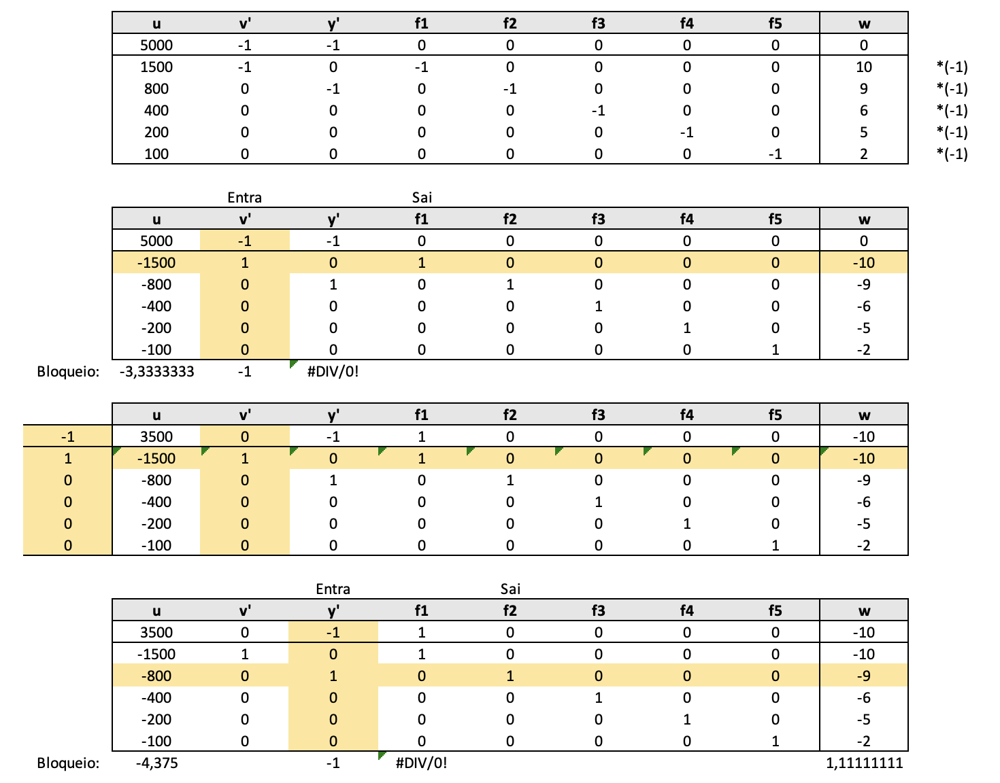

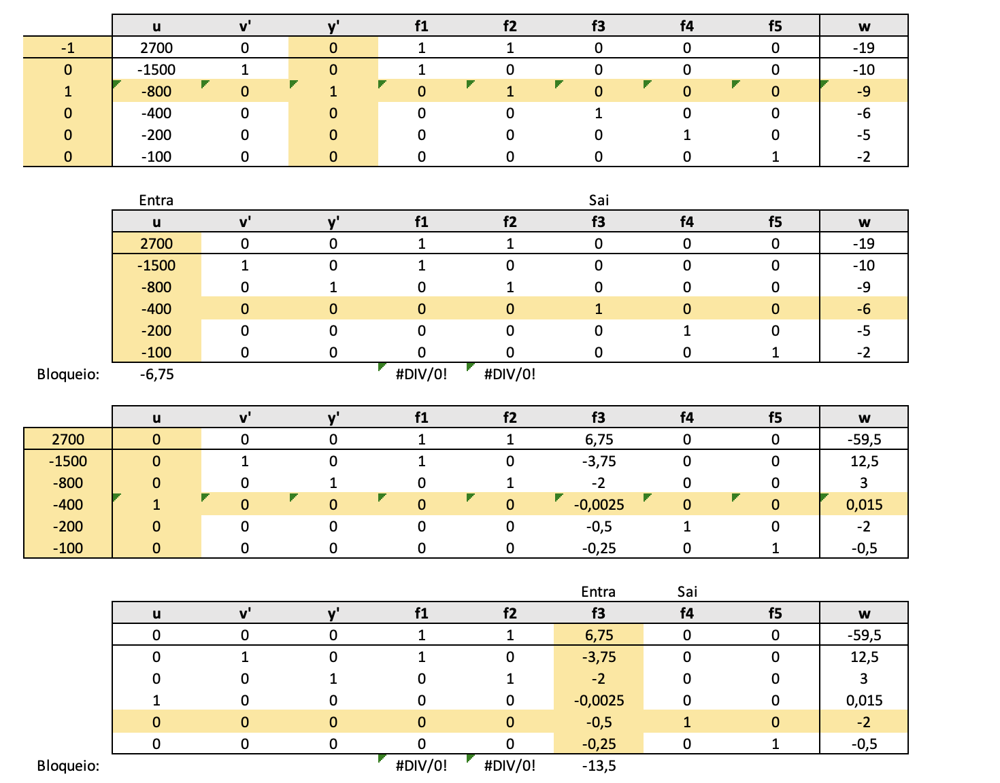

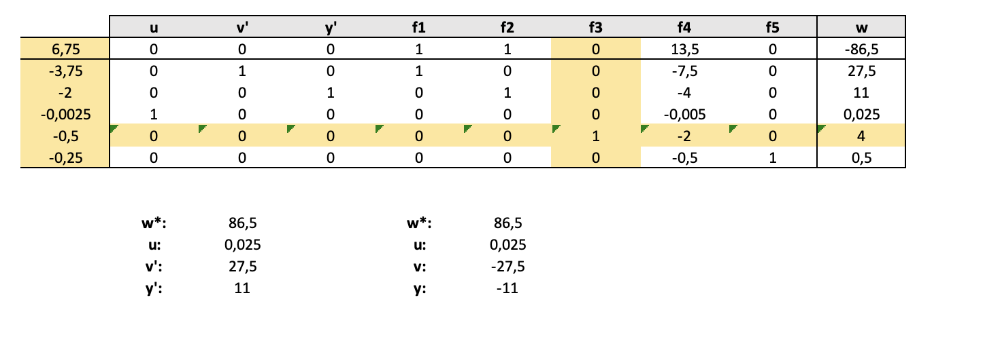

<hr>

# 6 Problema do Fluxo Máximo

## 6.1 Modelo genérico

### Conjuntos

$I \colon \text{Conjunto de nós da rede, } I = \{1,2,\ldots,m\},$

$K \colon \text{Conjunto de nós de origem, }K = \{1,2,\ldots,p\},$

$J \colon \text{Conjunto de nós de destino, }J = \{1,2,\ldots,n\}.$

### Parâmetros

$O \colon \text{Nó de origem da rede},$

$T \colon \text{Nó de destino da rede},$

$u_{ij} \colon \text{Limite máximo para o fluxo no arco (}i,j \text{)}, \;\; \forall i \in I \text{, } j \in J.$


### Variáveis de decisão

$x_{ij} \colon \text{Fluxo no arco (}i,j \text{)}, \;\; \forall i \in I \text{ e } j \in J.$


### Formulação matemática

$\text{max }z = \sum\limits_{k \in K} x_{k\text{T}}.$

sujeito a:

$\sum\limits_{k \in K} x_{k\text{T}} - \sum\limits_{j \in J} x_{\text{O}j} = 0,$

$\sum\limits_{k \in K} x_{ki} - \sum\limits_{j \in J} x_{ij} = 0, \;\; \forall i \in I \text{, } i \neq O,T,$

$x_{ij} \leq u_{ij}, \;\; \forall i \in I \text{, } j \in J,$

$x_{ij} \geq 0, \;\; \forall i \in I \text{, } j \in J.$

## 6.2 Aplicação didática

[Belfiore, P. e Fávero, L.P. 2013] A empresa Petroduto transporta óleo, gás natural, biocombustíveis renováveis, dentre outros produtos, por meio de uma malha sólida de dutos de 1.000 quilômetros. A empresa busca determinar o fluxo máximo de óleo (em $\text{m}^3\text{/s}$) que pode ser transportado na rede da figura abaixo, que tem como nó de origem ($O$) a estação de Minas e como nó de destino ($T$) um consumidor final localizado em São Paulo. Os valores nos arcos representam as capacidades máximas em cada arco (em $\text{m}^3\text{/s}$).

### 6.2.1 Resolução pelo Simplex

#### Código para gerar a grafo

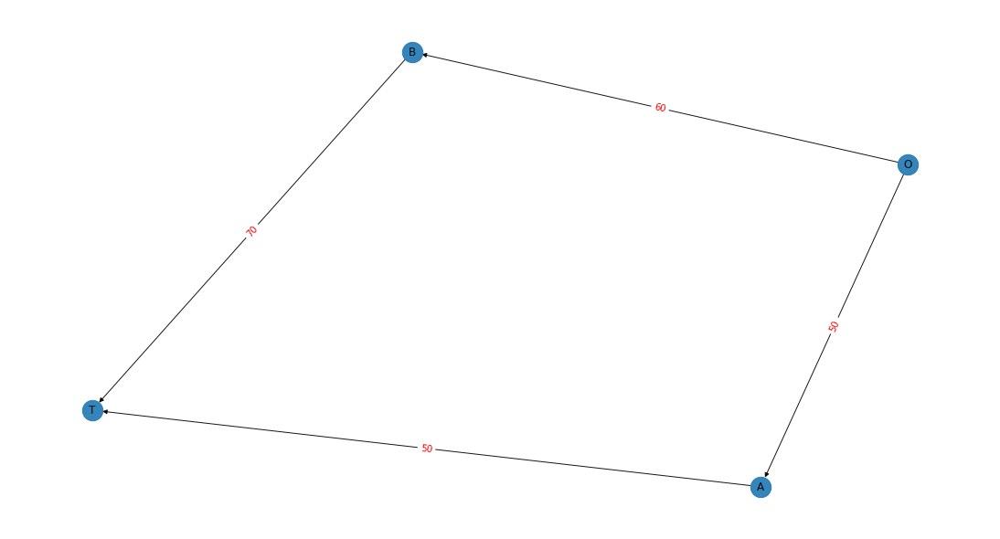

In [23]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 8

G = nx.DiGraph()
edges = [("O" ,"A"),("O" ,"B"),("A" ,"T"), ("B" ,"T")]
edge_labels={edges[0]: '50', edges[1]: '60', edges[2]: '50', edges[3]: '70'}
G.add_edges_from(edges)
pos = nx.spring_layout(G)
nx.draw(G, pos, width=1, linewidths=1, node_size=500, alpha=0.9, labels={node:node for node in G.nodes()})
nx.draw_networkx_edge_labels(G,pos,edge_labels=edge_labels,font_color='red')
plt.show()

#### Forma padrão

##### Variáveis de decisão

$x_{ij} = \text{fluxo no arco (}i,j \text{)}, \;\; \forall i \in I \text{, } j \in J.$

##### Formulação matemática

$\text{max }z = x_{AT} + x_{BT}.$

sujeito a

$x_{AT} + x_{BT} - x_{OA} - x_{OB} = 0,$

$x_{OA} - x_{AT} = 0,$

$x_{OB} - x_{BT} = 0,$

$x_{OA} + x_5 = 50,$

$x_{OB} + x_6 = 60,$

$x_{AT} + x_7 = 50,$

$x_{BT} + x_8 = 70,$

$x_{ij} \geq 0, \;\; \forall i \in I \text{, } j \in J.$


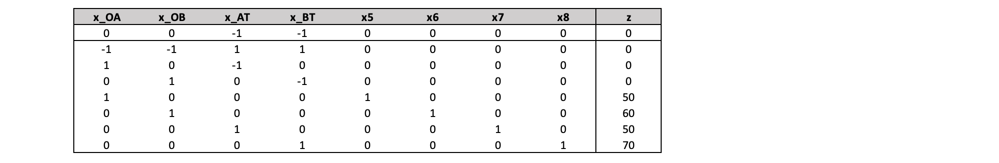

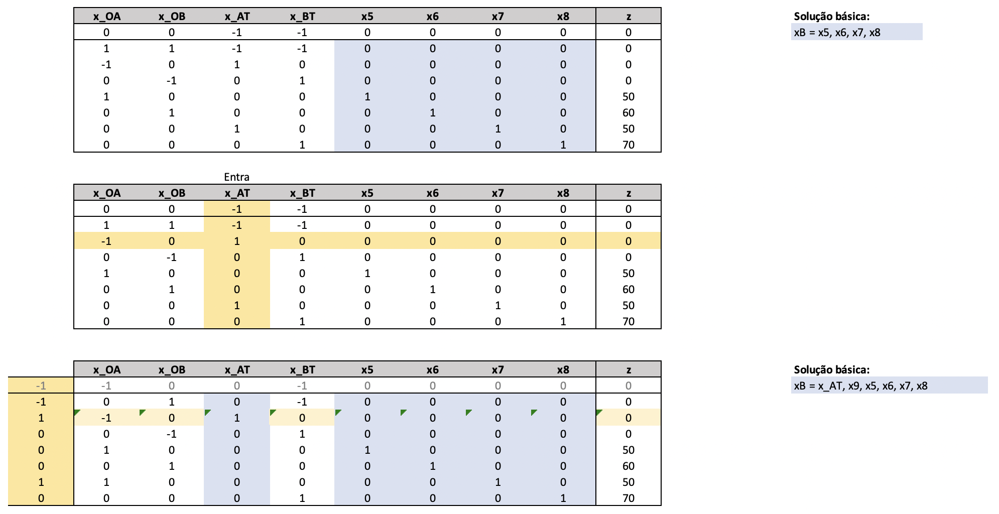

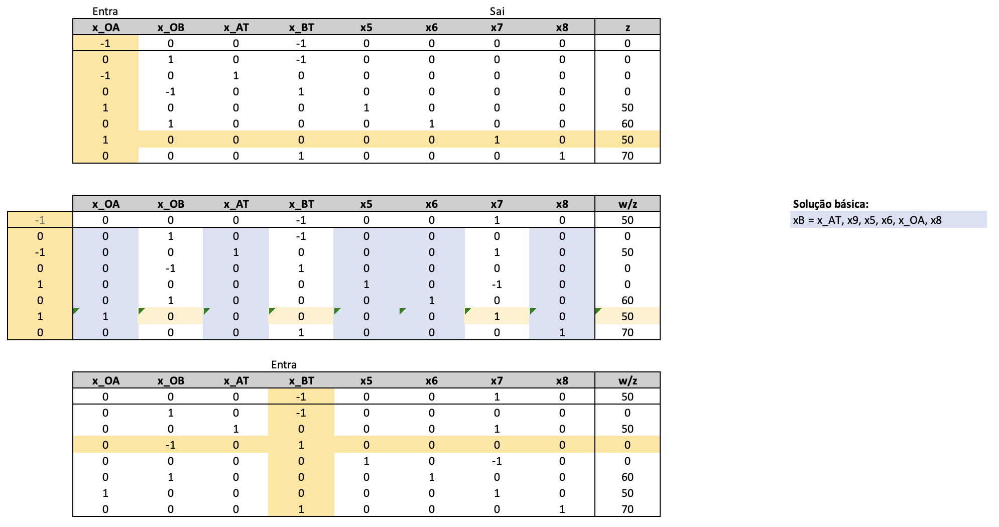

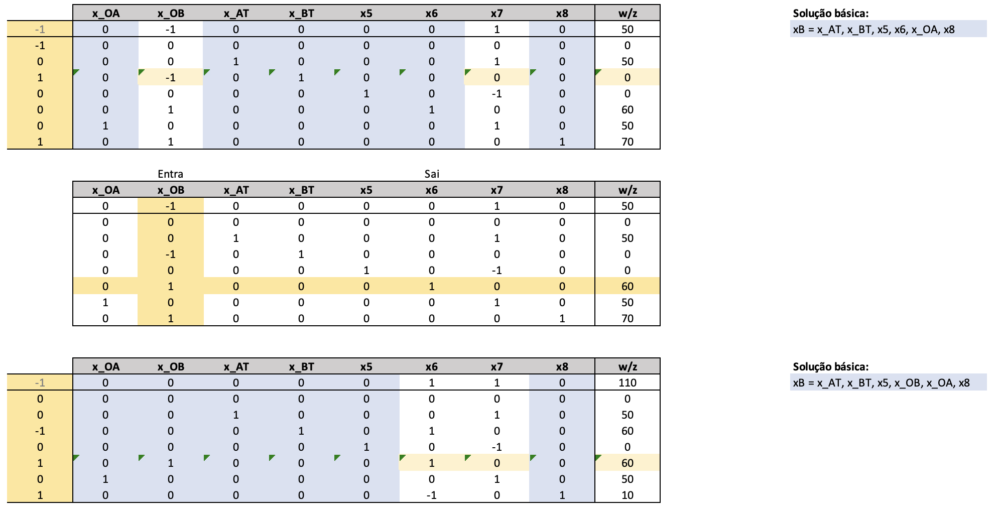

$z^* = 110$

$x_{OA} = 50$

$x_{OB} = 60$

$x_{AT} = 50$

$x_{BT} = 60$

## 6.3 Modelo Dual

### Variáveis de decisão

$u_1, u_2, u_3 \colon \text{Variáveis de decisão associadas às restrições de igualdade},$

$v_1, v_2, v_3, v_4 \colon \text{Variáveis de decisão associadas às restrições de fluxo máximo}.$

### Formulação matemática

$\text{min }w = 50v_1 + 60v_2 + 50v_3 + 70v_4.$

sujeito a

$-u_1 + u_2 + v_1 \geq 0,$

$-u_1 + u_3 + v_2 \geq 0,$

$u_1 - u_2 + v_3 \geq 1,$

$u_1 - u_3 + v_4 \geq 1,$

$u_1, u_2, u_3 \text{ irrestritas de sinal},$

$v1, v2, v3 \geq 0.$

### 6.3.2 Resolução através do Solver/Excel

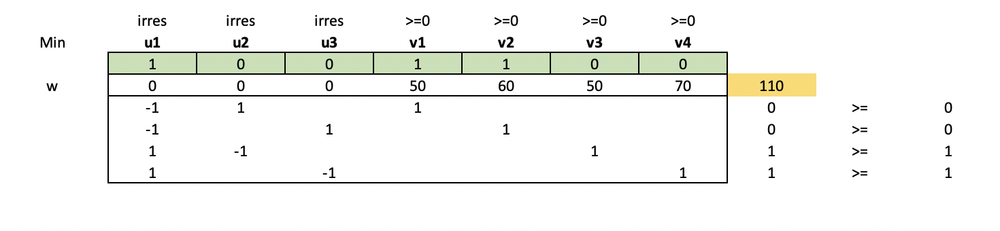

<hr>

# 7 Problema da Designação

## 7.1 Modelo genérico

### Conjunto

$M \colon \{1,2\ldots,m\}.$

### Parâmetros

$c_{ij} \colon \text{Custo de designar uma tarefa } i \text{ a uma máquina }j, \;\; \forall i,j \in M.$

### Variáveis de decisão

$
    x_{ij} \colon
    \begin{cases}
      1, & \text{se a tarefa } i \text{ é designada à máquina } j, \;\; \forall i,j \in M \\
      0, & \text{caso contrário}.
    \end{cases}
$


 ### Formulação matemática

$\text{min }z = \sum\limits_{i \in M} \sum\limits_{j \in M} c_{ij} x_{ij}.$

sujeito a

$\sum\limits_{j \in M} x_{ij} = 1, \;\; \forall i \in M,$

$\sum\limits_{i \in M} x_{ij} = 1, \;\; \forall j \in M,$

$x_{ij} \in \{0,1\}, \;\; \forall i,j \in M.$

## 7.2 Aplicação didática

[Belfiore, P. e Fávero, L.P. 2013] Uma indústria do setor de autopeças possui quatro máquinas (M1, M2, M3 e M4) e quatro atividades que devem ser completadas no processo de fabricação de bancos (acabamento, montagem, pintura e soldagem). Cada atividade pode ser designada a apenas uma máquina, e cada máquina pode processar apenas uma atividade. O tempo de processamento de cada atividade em cada máquina está ilustrado na tabela abaixo. Formule o problema de designação que tem como objetivo minimizar o tempo total de processamento.

| Atividade | M1 | M2 | M3 | M4 |
| --- | --- | --- | --- | --- | 
| Acabamento | 8 | 10 | 12 | 13 | 
| Montagem | 15 | 13 | 12 | 10 |
| Pintura| 8 | 12 | 10 | 9 |
| Soldagem | 15 | 11 | 10 | 8 |

### 7.2.1 Resolução através do Gurobi e Pyomo

#### Definição dos dados de entrada

In [24]:
cij = [[8,10,12,13], 
    [15,13,12,10], 
    [8,12,10,9], 
    [15,11,10,8]]

atividades = {0: 'ACABAMENTO', 1: 'MONTAGEM', 2: 'PINTURA', 3: 'SOLDAGEM'}
maquinas = {0: 'M1', 1: 'M2', 2: 'M3', 3: 'M4'}

#### Declaração do modelo computacional

In [25]:
# Declaração do modelo:

import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjunto:
modelo.M = range(len(cij))

# Parâmetros:
modelo.c = pyo.Param(modelo.M, modelo.M, initialize=lambda modelo, i, j: cij[i][j])

# Variáveis de decisão:
modelo.x = pyo.Var(modelo.M, modelo.M, within=pyo.Binary)

# Função objetivo:
def f_obj(modelo):
    return sum(modelo.c[i,j] * modelo.x[i,j] for i in modelo.M for j in modelo.M)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.minimize)

# Restrições:

# Cada tarefa i pode ser designada a apenas uma máquina j
modelo.restr_designacao = pyo.ConstraintList()
for i in modelo.M:
    modelo.restr_designacao.add(sum(modelo.x[i,j] for j in modelo.M) == 1.0)

# Cada máquina j pode processar apenas uma tarefa i
modelo.restr_processamento = pyo.ConstraintList()
for j in modelo.M:
    modelo.restr_processamento.add(sum(modelo.x[i,j] for i in modelo.M) == 1.0)

#### Solução

In [26]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


Problem: 
- Name: unknown
  Lower bound: 38.0
  Upper bound: 38.0
  Number of objectives: 1
  Number of constraints: 8
  Number of variables: 16
  Number of binary variables: 16
  Number of integer variables: 16
  Number of continuous variables: -16
  Number of nonzeros: 32
  Sense: 1
  Number of solutions: 2
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 0.015218019485473633
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



In [27]:
l = list(modelo.x.keys())
for i in l:
    if modelo.x[i]() != 0:
        print('Atividade', atividades[i[0]], 'designada para a máquina', maquinas[i[1]])

Atividade ACABAMENTO designada para a máquina M2
Atividade MONTAGEM designada para a máquina M3
Atividade PINTURA designada para a máquina M1
Atividade SOLDAGEM designada para a máquina M4


In [28]:
print("Função objetivo:", modelo.obj())

Função objetivo: 38.0


<hr>

# 8 Problema do Caixeiro Viajante

## 8.1 Modelo genérico (MTZ)

### Conjuntos:

$N \colon \{1,2 \ldots,n\},$

$U  \colon \{2,3, \ldots n\}.$

### Parâmetros do modelo

$d_{ij} \colon \text{Distância entre a origem } i \text{ e o destino }j, \;\; \forall i,j \in N.$


### Variáveis de decisão

$
    x_{ij} \colon
    \begin{cases}
      1, & \text{se a rota inclui o arco (i,j)} \;\; \forall i,j \in N \\
      0, & \text{caso contrário}.
    \end{cases}
$

### Variáveis auxiliares MTZ
$u_i \colon \text{Variáveis auxiliares de Miller-Tucker-Zemlin}, \;\; \forall i \in N.$


### Formulação matemática

$\text{min }z = \sum\limits_{i \in N} \sum\limits_{j \in N, j \neq i} d_{ij} x_{ij}.$

sujeito a

$\sum\limits_{i \in N, i \neq j} x_{ij} = 1, \;\; \forall j \in N,$

$\sum\limits_{j \in N, j \neq i} x_{ij} = 1, \;\; \forall i \in N,$

$u_i - u_j + nx_{ij} \leq n-1, \;\; i,j \in U \text{, } i \neq j,$

$x_{ij} \in \{0,1\}, \;\; \forall i,j \in N \text{, } j \neq i,$

$u_i \in \mathbb{R}^{+}.$

## 8.2 Aplicação Didática

[Adaptado de Woche, C., 2020] A empresa Puro Sabor realiza diariamente a entrega de marmitas congeladas na cidade Curitiba. A empresa, localizada no bairro da Cidade Industrial de Curitiba e com clientes distribuídos em 20 bairros da cidade, deseja encontrar a rota mais curta que visita cada um dos bairros e retorna à origem. Formule o modelo do Caixeiro Viajante com as restrições de Miller-Tucker-Zemlin.

| Bairro | Longitude | Latitude | Observação |
| --- | --- | --- | --- |
| Bacacherí | -49,2474748 | -25,4018619 | |
| Bairro Alto | -49,2268303 | -25,4123155 | |
| Batel | -49,297017 | -25,4413611 | |
| Boqueirão | -49,2529249 | -25,5054148 | |
| Cajuru | -49,2268961 | -25,4613033 | |
| Capão da Imbuia | -49,2260358 | -25,4367121 | |
| Centro | -49,2796458 | -25,4321587 | |
| Cidade Industrial | -49,3723223 | -25,4573673 | Início/Término da rota (base) |
| Fazendinha | -49,3331065 | -25,480968 | |
| Hauer | -49,2609939 | -25,4774216 | |
| Jardim das Américas | -49,2377161 | -25,4579512 | |
| Mossunguê | -49,3420312 | -25,4423293 | |
| Novo Mundo | -49,3131946 | -25,487748 | |
| Pilarzinho | -49,3250216 | -25,4018454 | |
| Pinheirinho | -49,3104457 | -25,5238141 | |
| Portão | -49,3097647 | -25,4720522 | |
| Santa Cândida | -49,2470586 | -25,3668842 | |
| São Braz | -49,371206 | -25,4119441 | |
| Sítio Cercado | -49,2875541 | -25,5440411 | |
| Tatuquara | -49,33638 | -25,5606956 | |
| Uberaba | -49,2330507 | -25,4900129 | |

### 8.2.1 Resolução através do Gurobi e Pyomo

#### Leitura dos dados de entrada

In [29]:
import os
import pandas as pd

BASE_DIR = os.path.abspath(".")
DATA_DIR = os.path.join(BASE_DIR, 'data')
PRF_FILE = 'bairros_curitiba.csv'

df = pd.read_csv(os.path.join(DATA_DIR, PRF_FILE),  sep=';', decimal=',')[['Bairro', 'Longitude', 'Latitude']]
df.head()

,Bairro,Longitude,Latitude
0,Bacacherí,-49.247475,-25.401862
1,Bairro Alto,-49.226830,-25.412315
2,Batel,-49.297017,-25.441361
3,Boqueirão,-49.252925,-25.505415
4,Cajuru,-49.226896,-25.461303


In [30]:
df.shape

(21, 3)

#### Construção da matriz de distâncias

In [31]:
import numpy as np
from haversine import haversine_vector, Unit

dij = df[['Latitude', 'Longitude']]
dij = [tuple(x) for x in dij.to_numpy()]
dij = haversine_vector(dij, dij, Unit.KILOMETERS, comb=True)

n = len(dij)

#### Declaração do modelo computacional

In [32]:
# Declaração do modelo:

import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjuntos:
modelo.N = pyo.RangeSet(n) 
modelo.U = pyo.RangeSet(2,n)

# Parâmetros:
modelo.d = pyo.Param(modelo.N, modelo.N,initialize=lambda modelo, i, j: dij[i-1][j-1])

# Variáveis de decisão:
modelo.x = pyo.Var(modelo.N, modelo.N, within=pyo.Binary)

# Variáveis auxiliares MTZ:
modelo.u = pyo.Var(modelo.N, within=pyo.NonNegativeIntegers,bounds=(0,n-1))

# Função objetivo:
def f_obj(modelo):
    return sum(modelo.x[i,j] * modelo.d[i,j] for i in modelo.N for j in modelo.N)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.minimize)

# Restrições:

def f_restr1(modelo, N):
    return sum(modelo.x[i,N] for i in modelo.N if i != N ) == 1
modelo.restr1 = pyo.Constraint(modelo.N, rule=f_restr1)

def f_restr2(modelo, N):
    return sum(modelo.x[N,j] for j in modelo.N if j != N) == 1
modelo.restr2 = pyo.Constraint(modelo.N, rule=f_restr2)

def f_restr3(modelo, i, j):
    if i!=j: 
        return modelo.u[i] - modelo.u[j] + modelo.x[i,j] * n <= n-1
    else:
        return modelo.u[i] - modelo.u[i] == 0 
modelo.restr3 = pyo.Constraint(modelo.U, modelo.N, rule=f_restr3)

#### Resultados

In [33]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


Problem: 
- Name: unknown
  Lower bound: 78.19744675610717
  Upper bound: 78.19744675610717
  Number of objectives: 1
  Number of constraints: 462
  Number of variables: 462
  Number of binary variables: 441
  Number of integer variables: 462
  Number of continuous variables: -441
  Number of nonzeros: 2040
  Sense: 1
  Number of solutions: 7
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 0.15722393989562988
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



#### Visualização gráfica dos resultados

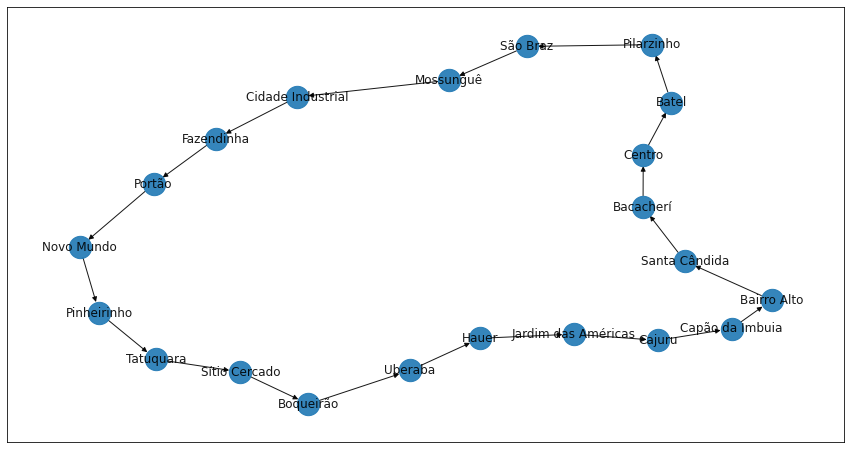

In [35]:
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 8
import networkx as nx

edges = []
l = list(modelo.x.keys())
for i in l:
    if modelo.x[i]() == 1.0:
        edges.append(i)
        
G = nx.DiGraph()
G.add_edges_from(edges)

pos = nx.spring_layout(G)
nx.draw_networkx(G, pos, width=1, linewidths=1, node_size=500, alpha=0.9, labels={node: df['Bairro'][node-1] for node in G.nodes()})

In [36]:
print("Função objetivo:", round(modelo.obj(),2))

Função objetivo: 78.2


<hr>

# 9 Problema de Localização de Instalações Capacitadas

## 9.1 Modelo genérico

### Conjuntos:

$I \colon \{1,2\ldots,m\},$

$J \colon \{1,2\ldots,n\}.$

### Parâmetros do modelo

$d_{ij} \colon \text{Distância do cliente } i \text{ até a instalação }j, \;\; \forall i \in I,j \in J,$

$c_i \colon \text{Demanda na localização }i \in I,$

$k_j \colon \text{Capacidade da instalação na localização }j \in J,$

$s_j \colon \text{Custo para construir a instalação na localização }j \in J,$

$B \colon \text{Orçamento disponível para construção das instalações}.$


### Variáveis de decisão

$
    x_{ij} \colon
    \begin{cases}
      1, & \text{se a demanda na localização } i \text{ é atendida pela instalação da localização } j, \;\; \forall i \in I,j \in J \\
      0, & \text{caso contrário},
    \end{cases}
$

$
    y_j \colon
    \begin{cases}
      1, & \text{se a instalação } j \in J \text{ foi construída} \\
      0, & \text{caso contrário}.
    \end{cases}
$


 ### Formulação matemática

$\text{min }z = \sum\limits_{i \in I} \sum\limits_{j \in J} c_i d_{ij} x_{ij}.$

sujeito a

$\sum\limits_{j \in J} s_j y_j \leq B,$

$\sum\limits_{j \in J} x_{ij} = 1, \;\; \forall i \in I,$

$\sum\limits_{i \in I} c_i x_{ij} \leq k_j y_j, \;\; \forall j \in J,$

$x_{ij}, y_j \in \{0,1\}, \;\; \forall i \in I,j \in J.$

## 9.2 Aplicação Didática

[Adaptado de Loch, G., 2020] A prefeitura de Curitiba deseja replanejar sua rede escolas de ensino básico para melhor atender o novo padrão de demanda por bairro. Considerando o orçamento de $\text{R\$ } 12.000.000,00$, a primeira etapa do projeto consiste em um estudo para identificar o número e a localização ótima das escolas nos seus 21 bairros. Em um levantamento preliminar foram identificadas a demanda, o custo para construir a escola e a capacidade da escola, caso seja aberta, em cada um dos bairros, conforme a tabela abaixo. Formule um modelo matemático para minimizar a distância dos alunos até as escola.

| Bairro | Longitude | Latitude | Demanda | Capacidade | Custo | 
| --- | --- | --- | --- | --- | --- |
| Bacacherí | -49,2474748 | -25,4018619 | 500 | 2298 | 1838400 | 
| Bairro Alto | -49,2268303 | -25,4123155 | 904 | 2877 | 3740100 | 
| Batel | -49,297017 | -25,4413611 | 685 | 1669 | 1669000 | 
| Boqueirão | -49,2529249 | -25,5054148 | 968 | 2674 | 4011000 | 
| Cajuru | -49,2268961 | -25,4613033 | 143 | 2722 | 2449800 | 
| Capão da Imbuia | -49,2260358 | -25,4367121 | 418 | 2384 | 2860800 | 
| Centro | -49,2796458 | -25,4321587 | 667 | 2088 | 2296800 | 
| Cidade Industrial | -49,3723223 | -25,4573673 | 903 | 1123 | 1347600 | 
| Fazendinha | -49,3331065 | -25,480968 | 815 | 1902 | 1902000 | 
| Hauer | -49,2609939 | -25,4774216 | 606 | 2947 | 4125800 | 
| Jardim das Américas | -49,2377161 | -25,4579512 | 259 | 1855 | 1669500 | 
| Mossunguê | -49,3420312 | -25,4423293 | 309 | 2168 | 3035200 | 
| Novo Mundo | -49,3131946 | -25,487748 | 403 | 2115 | 2749500 | 
| Pilarzinho | -49,3250216 | -25,4018454 | 168 | 2126 | 3401600 | 
| Pinheirinho | -49,3104457 | -25,5238141 | 815 | 2625 | 3412500 | 
| Portão | -49,3097647 | -25,4720522 | 960 | 2170 | 1736000 | 
| Santa Cândida | -49,2470586 | -25,3668842 | 755 | 1424 | 2278400 | 
| São Braz | -49,371206 | -25,4119441 | 431 | 2148 | 2362800 | 
| Sítio Cercado | -49,2875541 | -25,5440411 | 331 | 2115 | 232650 | 
| Tatuquara | -49,33638 | -25,5606956 | 460 | 1746 | 1746000 | 
| Uberaba | -49,2330507 | -25,4900129 | 728 | 1619 | 1295200 |


### 9.2.1 Resolução através do Gurobi e Pyomo

#### Leitura dos dados de entrada

In [37]:
import os
import pandas as pd

BASE_DIR = os.path.abspath(".")
DATA_DIR = os.path.join(BASE_DIR, 'data')
PRF_FILE = 'bairros_curitiba.csv'

df = pd.read_csv(os.path.join(DATA_DIR, PRF_FILE),  sep=';', decimal=',')
df.head()

,Bairro,Longitude,Latitude,Demanda,Capacidade,Custo
0,Bacacherí,-49.247475,-25.401862,500,2298,1838400
1,Bairro Alto,-49.226830,-25.412315,904,2877,3740100
2,Batel,-49.297017,-25.441361,685,1669,1669000
3,Boqueirão,-49.252925,-25.505415,968,2674,4011000
4,Cajuru,-49.226896,-25.461303,143,2722,2449800


In [38]:
df.describe()

,Longitude,Latitude,Demanda,Capacidade,Custo
count,21.000000,21.000000,21.000000,21.000000,2.100000e+01
mean,-49.287461,-25.460295,582.285714,2133.095238,2.388602e+06
std,0.048269,0.048939,263.263963,473.088354,9.921696e+05
min,-49.372322,-25.560696,143.000000,1123.000000,2.326500e+05
25%,-49.325022,-25.487748,403.000000,1855.000000,1.736000e+06
50%,-49.287554,-25.457951,606.000000,2126.000000,2.296800e+06
75%,-49.247059,-25.432159,815.000000,2384.000000,3.035200e+06
max,-49.226036,-25.366884,968.000000,2947.000000,4.125800e+06


#### Construção da matriz de distâncias e definição do orçamento disponível

In [39]:
import numpy as np
from haversine import haversine_vector, Unit

dij = df[['Latitude', 'Longitude']]
dij = [tuple(x) for x in dij.to_numpy()]
dij = haversine_vector(dij, dij, Unit.KILOMETERS, comb=True)

n = len(dij)

B = 12000000

#### Declaração do modelo computacional

In [41]:
import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjuntos:
modelo.I = pyo.RangeSet(n)
modelo.J = pyo.RangeSet(n) 

# Parâmetros:
modelo.d = pyo.Param(modelo.I, modelo.J, initialize=lambda modelo, i, j: dij[i-1][j-1])
modelo.c = pyo.Param(modelo.I, initialize=lambda modelo, i: df['Demanda'][i-1])
modelo.k = pyo.Param(modelo.J, initialize=lambda modelo, j: df['Capacidade'][j-1])
modelo.s = pyo.Param(modelo.J, initialize=lambda modelo, j: df['Custo'][j-1])

# Variáveis de decisão:
modelo.x = pyo.Var(modelo.I, modelo.J, within=pyo.Binary)
modelo.y = pyo.Var(modelo.I, within=pyo.Binary)

# Função objetivo:
def f_obj(modelo):
    return sum(modelo.c[i] * modelo.x[i,j] * modelo.d[i,j] for i in modelo.I for j in modelo.J)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.minimize)

# Restrições:
modelo.restr_1 = pyo.Constraint(expr=sum(modelo.s[j] * modelo.y[j] for j in modelo.J) <= B)


modelo.restr_2 = pyo.ConstraintList()
for i in modelo.I:
    modelo.restr_2.add(sum(modelo.x[i,j] for j in modelo.J) == 1.0)

def f_restr3(modelo,j):
    return sum(modelo.c[i] * modelo.x[i,j] for i in modelo.I)<= modelo.k[j] * modelo.y[j]
modelo.restr_3 = pyo.Constraint(modelo.J, rule=f_restr3)

#### Solução

In [42]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


Problem: 
- Name: unknown
  Lower bound: 26437.589005757978
  Upper bound: 26437.589005757978
  Number of objectives: 1
  Number of constraints: 43
  Number of variables: 462
  Number of binary variables: 462
  Number of integer variables: 462
  Number of continuous variables: -462
  Number of nonzeros: 924
  Sense: 1
  Number of solutions: 8
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 0.041159868240356445
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



In [43]:
print("Bairros onde deverão ser construídas as escolas:")

list_y = list(modelo.y.keys())
[df['Bairro'][j-1] for j in list_y if modelo.y[j]() == 1]

Bairros onde deverão ser construídas as escolas:


['Bacacherí',
 'Batel',
 'Cidade Industrial',
 'Fazendinha',
 'Jardim das Américas',
 'Portão',
 'Sítio Cercado',
 'Uberaba']

#### Visualização gráfica dos resultados

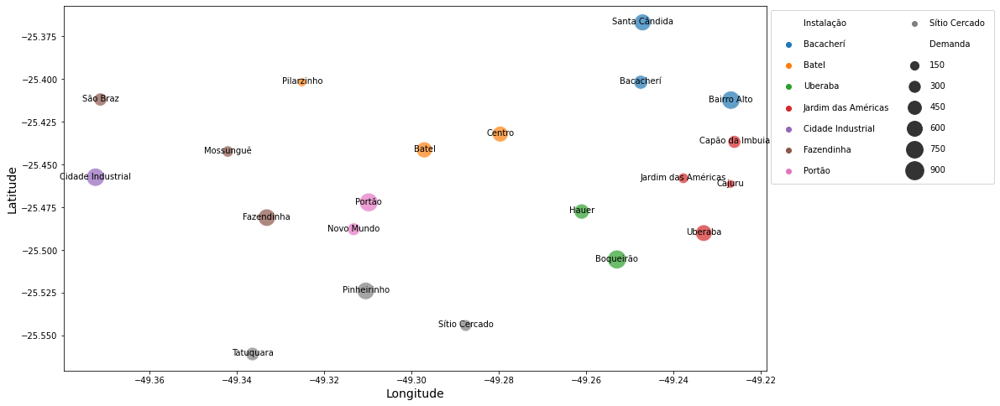

In [44]:
import pandas as pd
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 8
import seaborn as sns

list_x = list(modelo.x.keys())
alocacoes = [i for i in list_x if modelo.x[i]() == 1]
alocacoes.sort(key=lambda x:x[0])

df['Construir'] = [int(modelo.y[i]()) for i in list_y]
df['Instalação'] = [df['Bairro'][alocacao[1]-1] for alocacao in alocacoes]

b = sns.scatterplot(data=df, x="Longitude", y="Latitude", hue="Instalação", alpha=.7, size='Demanda',
                       sizes=(100,500), palette="tab10")

b.set_xlabel('Longitude', fontsize=14)
b.set_ylabel('Latitude', fontsize=14) 

for index, row in df.iterrows():
    b.text(row['Longitude'], row['Latitude']-0.001, df['Bairro'][index], horizontalalignment='center')

plt.legend(bbox_to_anchor=(1, 1), loc=2, ncol=2, title_fontsize=14, labelspacing=1.5, borderpad=1.1)

In [45]:
print("Função objetivo:", round(modelo.obj(),2))

Função objetivo: 26437.59


<hr>

# 10 Problema das P-Medianas

## 10.1 Modelo genérico

### Conjuntos

$I \colon \{1,2\ldots,m\},$

$J \colon \{1,2\ldots,n\}.$

### Parâmetros do modelo

$h_i \colon \text{Demanda no ponto }i \in I,$

$d_{ij} \colon \text{Distância entre o ponto de demanda } i \in I \text{ e a instalação do ponto }j \in J,$

$d_i^\text{max} \colon \text{Distância máxima que um ponto de demanda } i \in I \text{ pode estar da instalação do ponto } j \in J \text{ ao qual foi alocado},$

$P \colon \text{Número de instalações a serem construídas}.$

### Variáveis de decisão

$
    x_{ij} \colon
    \begin{cases}
      1, & \text{se o ponto de demanda } i \in M \text{ é associado à instalação no ponto } j \in J\\
      0, & \text{caso contrário},
    \end{cases}
$

$
    y_j \colon
    \begin{cases}
      1, & \text{se a instalação é construída no ponto } j \in J \\
      0, & \text{caso contrário}.
    \end{cases}
$


 ### Formulação matemática

$\text{min }z = \sum\limits_{i \in I} \sum\limits_{j \in J} h_i d_{ij} x_{ij}.$

sujeito a

$\sum\limits_{j \in J} x_{ij} = 1 \;\; \forall i \in I,$

$\sum\limits_{j \in J} y_{j} = P,$

$x_{ij} \leq y_j \;\; \forall i \in I \text{, }j \in J,$

$d_{ij} x_{ij} \leq d_i^\text{max} \;\; \forall i \in I \text{, }j \in J,$

$y_j, x_{ij} \in \{0,1\} \;\; \forall i \in I \text{, }j \in J.$

## 10.2 Aplicação real

A Polícia Rodoviária Federal (PRF) é uma instituição criada em 1928 responsável por manter a segurança viária e prevenir o crime nas estradas e rodovias federais brasileiras. A PRF está presente em todos os estados brasileiros por meio de Superintendências Regionais (SPRF) divididas em delegacias que são responsáveis pela coordenação das unidades operacionais (UOP) localizadas nas estradas e rodovias. As UOPs são responsáveis por registrar os acidentes em seu entorno e designar um viatura até o local do acidente quando este ocorrer com vítimas, o que evidencia que a distância entre as UOPs e os locais dos acidentes interfere diretamente na necessidade de recursos públicos para compra de combustível, manutenção e compra de veículos, contratação de policiais, além de impactar no tempo de resposta, que é o tempo decorrido entre o recebimento de uma chamada e a chegada da viatura no local do acidente.

Com base nos acidentes registrados pela SPRF do Paraná nos últimos 4 anos, este estudo tem como objetivo propor a quantidade e a localização das UOPs no estado do Paraná, de modo a minimizar as distâncias entre as UOPs e os locais dos acidentes e, consequentemente, minimizar o uso de recursos públicos e o tempo de resposta nos chamados.

Este estudo está sendo conduzido por mim, sob a orientação do Prof. Gustavo Loch, e apresento aqui uma prévia que, para fins didáticos, considera arbitráriamente a construção de 45 UOPs.

### 10.2.1 Resolução através do Gurobi e Pyomo

#### Leitura dos dados de entrada

In [46]:
import os
import pandas as pd

BASE_DIR = os.path.abspath(".")
DATA_DIR = os.path.join(BASE_DIR, 'data')
PRF_FILE = 'acidentes_pr.csv'

df = pd.read_csv(os.path.join(DATA_DIR, PRF_FILE))
df.head()

,municipio_id,municipio,latitude,longitude,acidentes,acidentes_mes,d_max
0,ADRIANOPOLIS 01,ADRIANOPOLIS,-24.8,-49.1,1,0.043269,160
1,ADRIANOPOLIS 02,ADRIANOPOLIS,-24.8,-49.0,3,0.097094,160
2,ALTO PARAISO 01,ALTO PARAISO,-23.4,-53.8,1,0.034144,160
3,ALTO PARANA 01,ALTO PARANA,-23.2,-52.3,17,0.401281,160
4,ALTO PARANA 02,ALTO PARANA,-23.1,-52.3,61,1.249060,80


In [47]:
df.describe()

,latitude,longitude,acidentes,acidentes_mes,d_max
count,423.000000,423.000000,423.000000,423.000000,423.000000
mean,-24.895035,-51.472813,75.881797,1.569465,124.669031
std,0.935072,1.622178,153.476646,3.132772,50.204644
min,-26.600000,-54.600000,1.000000,0.021458,5.000000
25%,-25.600000,-52.800000,10.000000,0.229839,80.000000
50%,-25.200000,-51.300000,29.000000,0.639682,160.000000
75%,-24.200000,-50.200000,69.000000,1.428731,160.000000
max,-22.800000,-48.500000,1637.000000,33.429906,160.000000


#### Construção da matriz de distâncias e definição do parâmetro P

In [48]:
import numpy as np
from haversine import haversine_vector, Unit

dij = df[['latitude', 'longitude']]
dij = [tuple(x) for x in dij.to_numpy()]
dij = haversine_vector(dij, dij, Unit.KILOMETERS, comb=True)

P = 45

#### Declaração do modelo computacional

In [49]:
import pyomo.environ as pyo

modelo = pyo.ConcreteModel()

# Conjuntos:
modelo.M = range(len(dij))
modelo.N = range(len(dij))

# Parâmetros:
modelo.d = pyo.Param(modelo.M, modelo.N, initialize=lambda modelo, i, j: dij[i][j])
modelo.h = pyo.Param(modelo.M, initialize=lambda modelo, i: df['acidentes'][i])
modelo.Dmax = pyo.Param(modelo.M, initialize=lambda modelo, i: df['d_max'][i], mutable=True)

# Variáveis de decisão:
modelo.y = pyo.Var(modelo.N, within=pyo.Binary)
modelo.x = pyo.Var(modelo.M, modelo.N, within=pyo.Binary)

# Função objetivo:
def f_obj(modelo):
    return sum(modelo.h[i] * modelo.x[i,j] * modelo.d[i,j] for i in modelo.M for j in modelo.N)
modelo.obj = pyo.Objective(rule=f_obj, sense=pyo.minimize)

# Restrições:

modelo.restr_1 = pyo.ConstraintList()
for i in modelo.M:
    modelo.restr_1.add(sum(modelo.x[i,j] for j in modelo.N) == 1.0)

modelo.restr_2 = pyo.Constraint(expr=sum(modelo.y[j] for j in modelo.N) == P)

modelo.restr_3 = pyo.ConstraintList()
for i in modelo.M:
    for j in modelo.N:
        modelo.restr_3.add(modelo.x[i,j] <= modelo.y[j])
        
modelo.restr_4 = pyo.ConstraintList()
for i in modelo.M:
    for j in modelo.N:
        modelo.restr_4.add(modelo.d[i,j] * modelo.x[i,j] <= modelo.Dmax[i])

#### Solução

In [50]:
result = pyo.SolverFactory('gurobi', solver_io="python").solve(modelo)
print(result)


Problem: 
- Name: unknown
  Lower bound: 297093.7552793517
  Upper bound: 297093.7552793517
  Number of objectives: 1
  Number of constraints: 358282
  Number of variables: 179352
  Number of binary variables: 179352
  Number of integer variables: 179352
  Number of continuous variables: -179352
  Number of nonzeros: 715716
  Sense: 1
  Number of solutions: 4
Solver: 
- Name: Gurobi 9.11
  Status: ok
  Wallclock time: 1.23319411277771
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
Solution: 
- number of solutions: 0
  number of solutions displayed: 0



#### Visualização gráfica dos resultados

In [51]:
tuplas_alocacoes = [x for x in list(modelo.x.keys()) if modelo.x[x]() == 1]
tuplas_alocacoes.sort(key=lambda x:x[0])
df['y'] = [modelo.y[j]() for j in list(modelo.y.keys())]
df['idx_origem'] = [tupla[0] for tupla in tuplas_alocacoes]
df['idx_mediana'] = [tupla[1] for tupla in tuplas_alocacoes]
df['nome_mediana'] = [df['municipio_id'][idx] for idx in df['idx_mediana']]

df_medians = df[df['y'] == 1].copy()

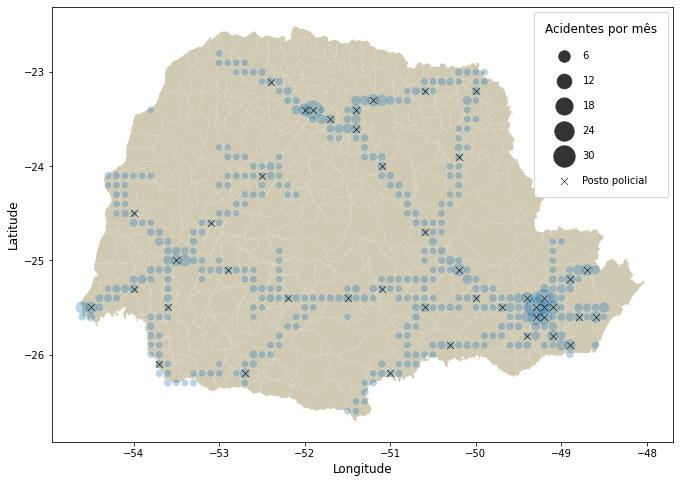

In [52]:
import geopandas as gpd
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
import seaborn as sns

MAP_DIR = os.path.join(BASE_DIR, 'ibge')
SHAPE_FILE = 'PR_Municipios_2019.shp'
df_shape = gpd.read_file(os.path.join(MAP_DIR, SHAPE_FILE))

fig, ax = plt.subplots(figsize=(15,8))
df_shape.plot(ax = ax, color = '#d1cab2')

b = sns.scatterplot(data=df, x='longitude', y='latitude', size='acidentes_mes', sizes=(50,500), alpha=0.3)
sns.scatterplot(data=df_medians, x='longitude', y='latitude', s=50, marker="x", color="black", 
                label='Posto policial')

b.set_xlabel('Longitude',fontsize=12)
b.set_ylabel('Latitude',fontsize=12) 

plt.legend(title='Acidentes por mês', title_fontsize=12, labelspacing=1.5, borderpad=1.1)

plt.show()

# 11 - Discussão sobre GAP e solução factível inicial

Seja $P$ o modelo primal de um determinado problema:

$\text{max }z = f(\mathbf{x}) = \mathbf{c}^t \mathbf{x}$

sujeito a

$\mathbf{Ax} \leq \mathbf{b}$

$\mathbf{x} \geq 0$

<br>

E $D$ o seu respectivo modelo dual:

$\text{min }w = g(\mathbf{u}) = \mathbf{b}^t \mathbf{u}$

sujeito a

$\mathbf{A}^t \mathbf{u} \geq \mathbf{c}$

$\mathbf{u} \geq 0$

Considerando $\mathbf{x}$ uma solução factível de $P$ e $\mathbf{u}$ uma solução factível de $D$, $f(\mathbf{x}) \leq g(\mathbf{u})$. Esta afirmação é fundamentada no Teorema Fraco da Dualidade. 

Considerado agora $\mathbf{x}^*$ uma solução factível de $P$ e $\mathbf{u}^*$ uma solução factível de $D$, se $f(\mathbf{x}^*) = g(\mathbf{u}^*)$, então $\mathbf{x}^*$ é a solução ótima de $P$ e $\mathbf{u}^*$ é a solução ótima de $D$, afirmação fundamentada no Teorema Forte da Dualidade, que garante que se $P$ possui uma solução ótima, $D$ também possui.

A diferença percentual entre $f(\mathbf{x})$ e $g(\mathbf{u})$, dado que $\mathbf{x}$ uma solução factível de $P$ e $\mathbf{u}$ uma solução factível de $D$, é conhecida como GAP, que em outras palavras, é uma estimativa do quão longe a solução factível atual está da solução ótima. Quando o GAP e igual a 0, significa que foi encontrada a solução ótima tanto do modelo primal quanto do dual.

O Teorema da Folga Complementar permite através da resolução de um dos problemas (primal ou dual), obter a resolução do outro, tornando possível escolher o problema menos complexo para aplicar o método de resolução e com isto economizar tempo computacional.

São comuns casos onde o SIMPLEX realiza uma série de iterações até chegar na região factível do problema. Dependendo do tamanho do problema e das particularidades de sua aplicação, estas iterações podem representar um custo computacional expressivo. Existem métodos para se obter uma solução factível inicial, que podem ser usados com a intenção de eliminar estas iterações fora da região factível. Entretanto, a aplicação destes métodos deve ser analisada quanto ao custo computacional. No problema do transporte, por exemplo, é comum utilizar métodos como o do Canto Noroeste, Custo Mínimo e Vogel para se obter uma solução factível inicial. Geralmente o primeiro método, com o menor custo computacional, encontra uma solução factível inicial mais longe da solução ótima do que o último, que possui maior custo computacional, ficando por conta do pesquisador avaliar por todos os ângulos o cenário e decidir quando utilizar cada um dos métodos.

Em resumo, a vantagem de se utilizar um método para obter uma solução factível inicial melhor é a redução de iterações até a solução ótima e a desvantagem é a possibilidade do custo computacional deste método não compensar.

# 12 - Referências

ARENALES, M. et al. Pesquisa Operacional para Cursos de Engenharia. Elsevier Brasil, 2007.

BELFIORE, P.; FÁVERO, L. P. Pesquisa Operacional para Cursos de Engenharia. Elsevier Brasil, 2013.

LOCH, G. V. Problema das p-Medianas utilizando C# e Gurobi. 2020. Disponível em: <https://www.youtube.com/watch?v=dk0LHa_UVKc&list=PLTv9E12xrX8Om5Brh3PDXA_XN7amnS8Lc>. Acesso em: 25 de mai. 2021.

WOCHE, C. Modelagem e Resolução do Problema do Caixeiro Viajante com Python e Pyomo. 2020. Disponível em: <http://www.opl.ufc.br/pt/post/tsp/>. Acesso em: 27 de mai. 2021.